In [5]:
import pandas as pd
import os
import json
from pathlib import Path
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
output_dir = '/home/jupyter-benjamin.andrick-3cf07/test/logs'

# Deviation Analysis

## properties nach prepro

In [ ]:
def visualize_property_distributions(root_path):
    """
    Iterate over folders and visualize distributions from new_properties_2.csv files.
    
    Args:
        root_path (str): Path to the root folder containing subfolders
    """
    dfs = {}
    
    for folder_path in Path(root_path).iterdir():
        if not folder_path.is_dir() or folder_path.name.startswith('.'):
            continue
            
        csv_path = folder_path / 'new_properties_2.csv'
        if not csv_path.exists():
            print(f"No new_properties_2.csv found in {folder_path.name}")
            continue
            
        try:
            df = pd.read_csv(csv_path)
            dfs[folder_path.name] = df
            print(f"Successfully loaded data from {folder_path.name}")
        except Exception as e:
            print(f"Error reading {csv_path}: {str(e)}")
            continue
    
    if not dfs:
        print("No data found to visualize")
        return
    print(len(dfs))
    common_columns = set.intersection(*[set(df.columns) for df in dfs.values()])
    numeric_columns = []
    
    sample_df = next(iter(dfs.values()))
    for col in common_columns:
        if pd.api.types.is_numeric_dtype(sample_df[col]):
            numeric_columns.append(col)
    print(numeric_columns)
    for column in numeric_columns:
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 2, 1)
        data_to_plot = [df[column].dropna() for df in dfs.values()]
        plt.boxplot(data_to_plot, labels=list(dfs.keys()))
        plt.title(f'Boxplot of {column}')
        plt.xticks(rotation=45)
        
        plt.subplot(1, 2, 2)
        all_values = []
        all_labels = []
        for label, df in dfs.items():
            values = df[column].dropna()
            all_values.extend(values)
            all_labels.extend([label] * len(values))
        
        sns.violinplot(x=all_labels, y=all_values)
        plt.title(f'Violin Plot of {column}')
        plt.xticks(rotation=45)
        
        plt.tight_layout()
        print(1)
        plt.show()
        
        print(f"\nSummary Statistics for {column}:")
        print("-" * 50)
        stats_df = pd.DataFrame({
            name: {
                'count': df[column].count(),
                'mean': df[column].mean(),
                'std': df[column].std(),
                'min': df[column].min(),
                'max': df[column].max(),
                'median': df[column].median()
            }
            for name, df in dfs.items()
        }).T
        
        print(stats_df.round(4))
        print("\n" + "=" * 80 + "\n")

root_path = '//home/jupyter-benjamin.andrick-3cf07/test/logs'
visualize_property_distributions(root_path)

Successfully loaded data from combined_ind
Successfully loaded data from standard
Successfully loaded data from case_size_filtered
Successfully loaded data from inductive_logs
No new_properties_2.csv found in Log Berechnungen
Successfully loaded data from variants_coverage_filtered
Successfully loaded data from variants_top_k_filtered
Successfully loaded data from combined_filters
7
[]



Processing combined_ind
Found 26 numeric columns after conversion


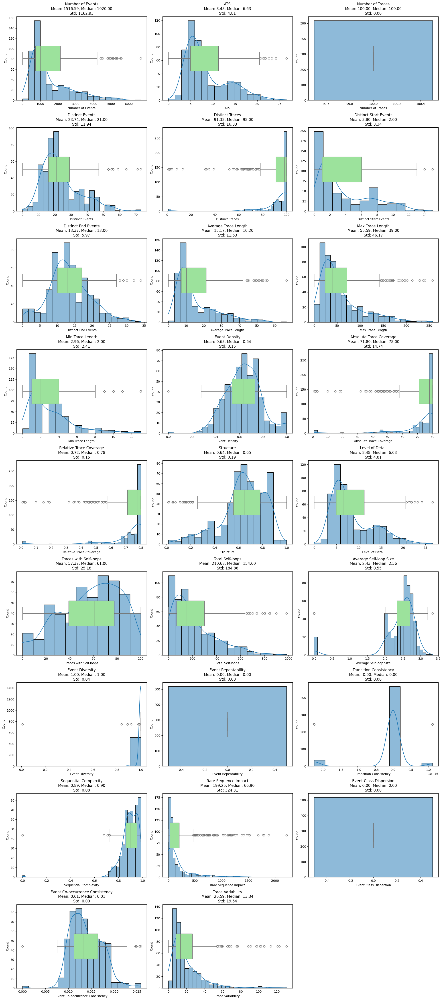


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          519.0000  519.0000             519.0         519.0000   
mean          1516.5877    8.4767             100.0          23.7418   
std           1162.9293    4.8057               0.0          11.9393   
min              0.0000    0.0000             100.0           0.0000   
25%            727.0000    4.9600             100.0          16.0000   
50%           1020.0000    6.6300             100.0          21.0000   
75%           2136.5000   11.2350             100.0          29.0000   
max           6666.0000   26.5900             100.0          73.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         519.0000               519.0000             519.0000   
mean           91.3757                 3.7996              13.3699   
std            16.8273                 3.3419               5.9708   

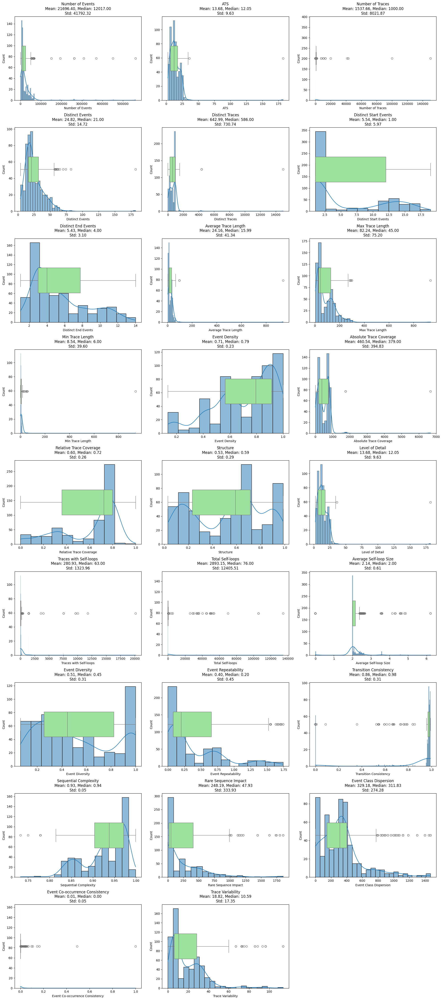


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          566.0000  566.0000          566.0000         566.0000   
mean         21696.4028   13.6800         1537.6555          24.8198   
std          41792.3197    9.6337         8021.8697          14.7186   
min             48.0000    2.5965            1.0000           4.0000   
25%           7202.7500    6.6800          870.5000          16.0000   
50%          12017.0000   12.0515         1000.0000          21.0000   
75%          24806.7500   17.8430         1000.0000          32.0000   
max         561470.0000  182.0000       150370.0000         182.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         566.0000               566.0000             566.0000   
mean          642.9894                 5.5389               5.4293   
std           730.7364                 5.9705               3.0974   

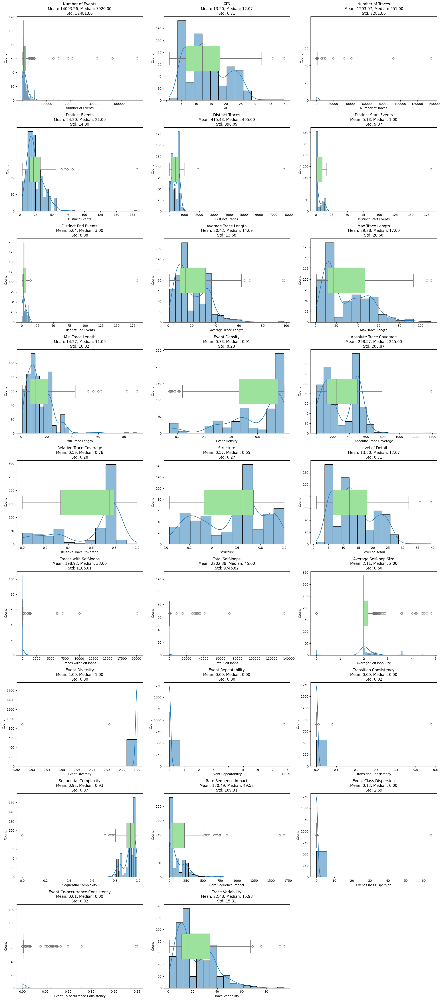


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          567.0000  567.0000          567.0000         567.0000   
mean         14093.2593   13.5007         1203.0741          24.1975   
std          32481.8608    6.7103         7281.8557          13.9957   
min            102.0000    1.0000            4.0000           4.0000   
25%           4478.5000    6.5487          597.5000          15.0000   
50%           7920.0000   12.0688          651.0000          21.0000   
75%          13356.0000   17.9612          712.5000          32.0000   
max         475196.0000   39.4988       136544.0000         182.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         567.0000               567.0000             567.0000   
mean          415.4832                 5.1764               5.0370   
std           396.0893                 9.0695               8.0796   

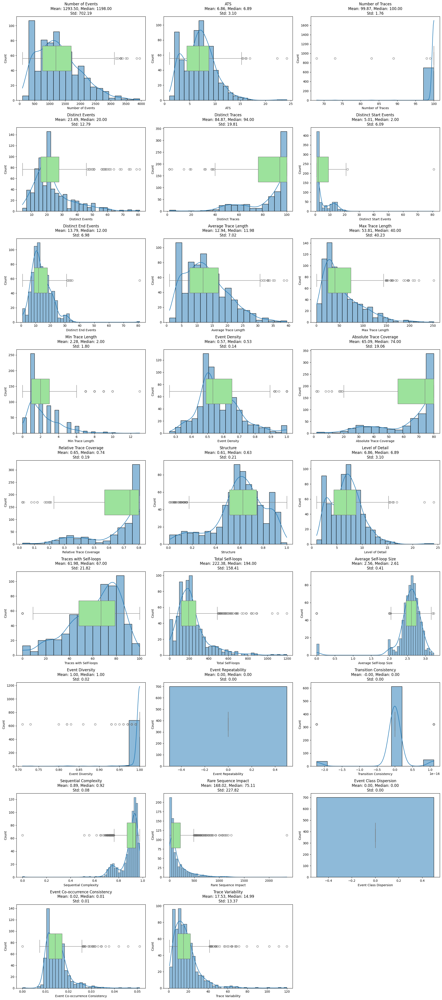


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          701.0000  701.0000          701.0000         701.0000   
mean          1293.4950    6.8633           99.8716          23.4850   
std            702.1851    3.1027            1.7552          12.7938   
min            100.0000    1.0000           68.0000           4.0000   
25%            762.0000    4.4000          100.0000          16.0000   
50%           1198.0000    6.8900          100.0000          20.0000   
75%           1703.0000    8.7800          100.0000          28.0000   
max           3948.0000   24.2100          100.0000          81.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         701.0000               701.0000             701.0000   
mean           84.8688                 5.0086              13.7946   
std            19.8099                 6.0886               6.9798   

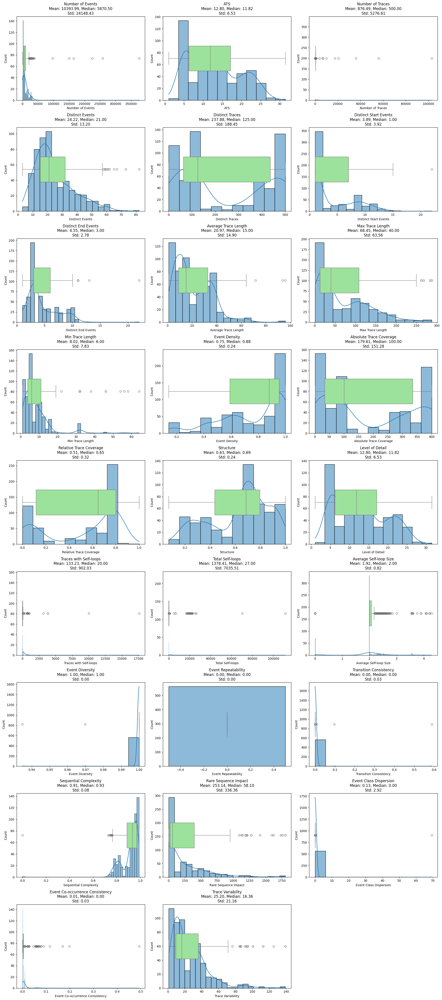


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          564.0000  564.0000          564.0000         564.0000   
mean         10393.9858   12.8010          876.4894          24.2181   
std          24148.4274    6.5345         5276.6099          13.2049   
min             48.0000    1.0000            2.0000           3.0000   
25%           2971.7500    6.2663          447.5000          15.0000   
50%           5870.5000   11.8200          500.0000          21.0000   
75%          10346.7500   17.1204          500.0000          32.0000   
max         375152.0000   31.4780       102853.0000          82.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count          564.000               564.0000             564.0000   
mean           237.883                 3.8918               4.5514   
std            188.447                 3.9207               2.7795   

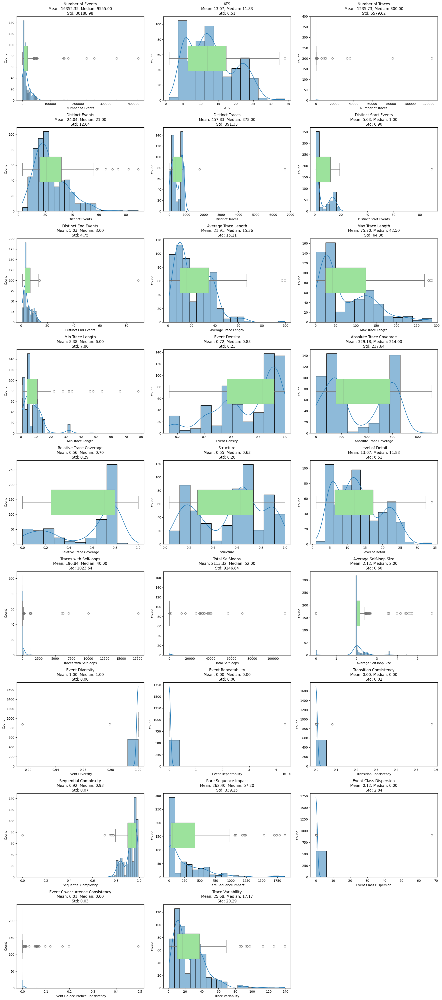


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          564.0000  564.0000          564.0000         564.0000   
mean         16352.3457   13.0661         1235.7323          24.0355   
std          30188.9754    6.5127         6579.6246          12.6450   
min             48.0000    1.0000            2.0000           3.0000   
25%           5438.2500    6.3436          713.5000          15.7500   
50%           9555.0000   11.8338          800.0000          21.0000   
75%          18566.5000   17.2966          800.0000          32.0000   
max         415922.0000   34.0312       123238.0000          89.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         564.0000               564.0000             564.0000   
mean          457.8262                 5.6294               5.0301   
std           391.3278                 6.8981               4.7492   

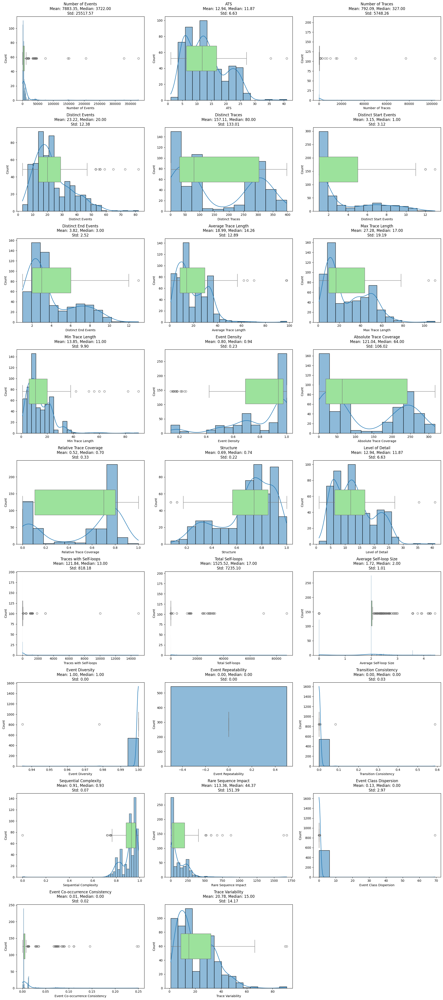


Summary Statistics:
--------------------------------------------------
       Number of Events       ATS  Number of Traces  Distinct Events  \
count          545.0000  545.0000          545.0000         545.0000   
mean          7883.3523   12.9362          792.0899          23.2239   
std          25517.5705    6.6314         5748.2599          12.3830   
min             86.0000    1.0000            4.0000           3.0000   
25%           2070.0000    6.3872          192.0000          14.0000   
50%           3722.0000   11.8680          327.0000          20.0000   
75%           6205.0000   16.7834          351.0000          29.0000   
max         375152.0000   40.9531       102853.0000          82.0000   

       Distinct Traces  Distinct Start Events  Distinct End Events  \
count         545.0000               545.0000             545.0000   
mean          157.1064                 3.1541               3.8183   
std           133.0129                 3.1169               2.5172   

In [ ]:
def visualize_individual_property_distributions(root_path):
    """
    Create individual visualizations for each new_properties_2.csv file.
    
    Args:
        root_path (str): Path to the root folder containing subfolders
    """
    numeric_column_names = [
        'Number of Events', 'ATS', 'Number of Traces', 'Distinct Events',
        'Distinct Traces', 'Distinct Start Events', 'Distinct End Events',
        'Average Trace Length', 'Max Trace Length', 'Min Trace Length',
        'Event Density', 'Absolute Trace Coverage', 'Relative Trace Coverage',
        'Structure', 'Level of Detail', 'Traces with Self-loops',
        'Total Self-loops', 'Average Self-loop Size', 'Event Diversity',
        'Event Repeatability', 'Transition Consistency', 'Sequential Complexity',
        'Rare Sequence Impact', 'Event Class Dispersion',
        'Event Co-occurrence Consistency', 'Trace Variability'
    ]
    
    for folder_path in Path(root_path).iterdir():
        if not folder_path.is_dir() or folder_path.name.startswith('.'):
            continue
            
        csv_path = folder_path / 'new_properties_2.csv'
        if not csv_path.exists():
            print(f"No new_properties_2.csv found in {folder_path.name}")
            continue
            
        print(f"\nProcessing {folder_path.name}")
        print("=" * 50)
        
        try:
            df = pd.read_csv(csv_path)
            
            for col in numeric_column_names:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
            
            numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
            print(f"Found {len(numeric_columns)} numeric columns after conversion")
            
            if len(numeric_columns) == 0:
                print("No numeric columns found after conversion!")
                continue
            
            n_cols = 3  # Number of columns in the grid
            n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Ceiling division
            
            plt.figure(figsize=(20, 5 * n_rows))
            
            for idx, column in enumerate(numeric_columns, 1):
                plt.subplot(n_rows, n_cols, idx)
                
                valid_data = df[column].dropna()
                if len(valid_data) == 0:
                    plt.text(0.5, 0.5, 'No valid data', ha='center', va='center')
                    continue
                
                sns.histplot(valid_data, kde=True)
                
                ax2 = plt.gca().twinx()
                sns.boxplot(x=valid_data, ax=ax2, color='lightgreen', width=0.3)
                ax2.set_ylim(-0.5, 0.5)  # Fixed y-range for boxplot
                ax2.set_yticks([])  # Hide y-axis for boxplot
                
                plt.title(f'{column}\n'
                         f'Mean: {valid_data.mean():.2f}, '
                         f'Median: {valid_data.median():.2f}\n'
                         f'Std: {valid_data.std():.2f}',
                         fontsize=12)
                
            plt.tight_layout()
            plt.show()
            
            print("\nSummary Statistics:")
            print("-" * 50)
            stats_df = df[numeric_columns].describe()
            print(stats_df.round(4))
            
            print("\nAdditional Distribution Metrics:")
            print("-" * 50)
            metrics_df = pd.DataFrame({
                'skewness': df[numeric_columns].skew(),
                'kurtosis': df[numeric_columns].kurtosis(),
                'missing_values': df[numeric_columns].isnull().sum(),
                'missing_percentage': (df[numeric_columns].isnull().sum() / len(df) * 100).round(2)
            })
            print(metrics_df)
            
        except Exception as e:
            print(f"Error processing {csv_path}: {str(e)}")
            print("Full error:")
            import traceback
            traceback.print_exc()
            continue
        
        print("\n" + "=" * 80 + "\n")

root_path = '/home/jupyter-benjamin.andrick-3cf07/test/logs'
visualize_individual_property_distributions(root_path)

Successfully loaded and converted data from combined_ind
Successfully loaded and converted data from standard
Successfully loaded and converted data from case_size_filtered
Successfully loaded and converted data from inductive_logs
No new_properties_2.csv found in Log Berechnungen
Successfully loaded and converted data from variants_coverage_filtered
Successfully loaded and converted data from variants_top_k_filtered
Successfully loaded and converted data from combined_filters


/tmp/ipykernel_2084231/246905070.py:61: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_to_plot, labels=list(dfs.keys()))
/tmp/ipykernel_2084231/246905070.py:61: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_to_plot, labels=list(dfs.keys()))
/tmp/ipykernel_2084231/246905070.py:61: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_to_plot, labels=list(dfs.keys()))
/tmp/ipykernel_2084231/246905070.py:61: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt

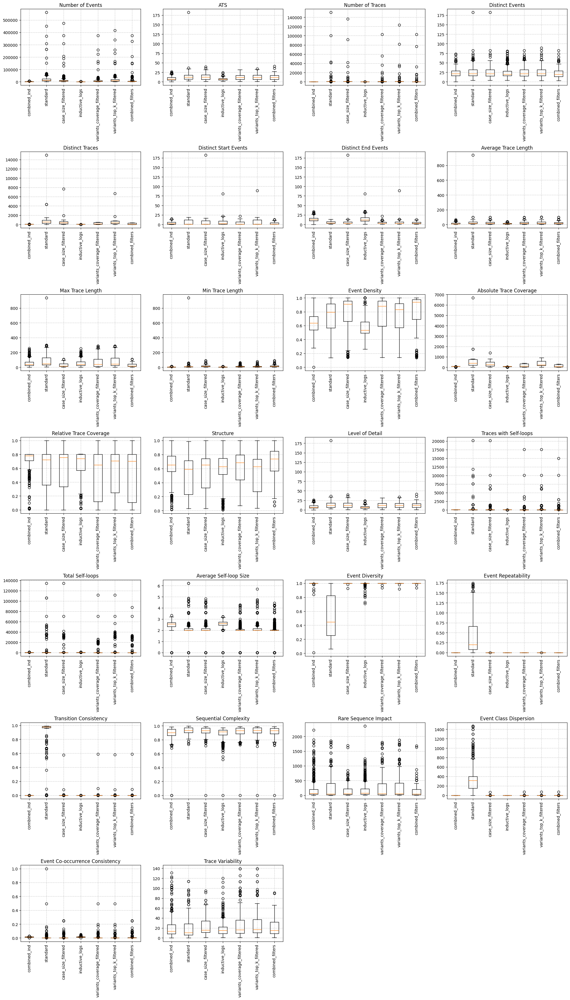


Summary Statistics:

Number of Events:
--------------------------------------------------
                            count        mean         std    min       max  \
combined_ind                519.0   1516.5877   1162.9293    0.0    6666.0   
standard                    566.0  21696.4028  41792.3197   48.0  561470.0   
case_size_filtered          567.0  14093.2593  32481.8608  102.0  475196.0   
inductive_logs              701.0   1293.4950    702.1851  100.0    3948.0   
variants_coverage_filtered  564.0  10393.9858  24148.4274   48.0  375152.0   
variants_top_k_filtered     564.0  16352.3457  30188.9754   48.0  415922.0   
combined_filters            545.0   7883.3523  25517.5705   86.0  375152.0   

                             median  
combined_ind                 1020.0  
standard                    12017.0  
case_size_filtered           7920.0  
inductive_logs               1198.0  
variants_coverage_filtered   5870.5  
variants_top_k_filtered      9555.0  
combined_filters  

In [ ]:
def visualize_property_distributions(root_path):
    """
    Iterate over folders and visualize distributions from new_properties_2.csv files.
    All boxplots are displayed together in one figure.
    
    Args:
        root_path (str): Path to the root folder containing subfolders
    """
    numeric_column_names = [
        'Number of Events', 'ATS', 'Number of Traces', 'Distinct Events',
        'Distinct Traces', 'Distinct Start Events', 'Distinct End Events',
        'Average Trace Length', 'Max Trace Length', 'Min Trace Length',
        'Event Density', 'Absolute Trace Coverage', 'Relative Trace Coverage',
        'Structure', 'Level of Detail', 'Traces with Self-loops',
        'Total Self-loops', 'Average Self-loop Size', 'Event Diversity',
        'Event Repeatability', 'Transition Consistency', 'Sequential Complexity',
        'Rare Sequence Impact', 'Event Class Dispersion',
        'Event Co-occurrence Consistency', 'Trace Variability'
    ]
    
    dfs = {}
    
    for folder_path in Path(root_path).iterdir():
        if not folder_path.is_dir() or folder_path.name.startswith('.'):
            continue
            
        csv_path = folder_path / 'new_properties_2.csv'
        if not csv_path.exists():
            print(f"No new_properties_2.csv found in {folder_path.name}")
            continue
            
        try:
            df = pd.read_csv(csv_path)
            
            for col in numeric_column_names:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
            
            dfs[folder_path.name] = df
            print(f"Successfully loaded and converted data from {folder_path.name}")
        except Exception as e:
            print(f"Error reading {csv_path}: {str(e)}")
            continue
    
    if not dfs:
        print("No data found to visualize")
        return
    
    common_columns = set.intersection(*[set(df.columns) for df in dfs.values()])
    numeric_columns = [col for col in numeric_column_names if col in common_columns]
    
    n_cols = 4  # Number of columns in the grid
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Ceiling division
    
    plt.figure(figsize=(20, 5 * n_rows))
    
    for idx, column in enumerate(numeric_columns, 1):
        plt.subplot(n_rows, n_cols, idx)
        
        data_to_plot = [df[column].dropna() for df in dfs.values()]
        plt.boxplot(data_to_plot, labels=list(dfs.keys()))
        plt.title(column)
        plt.xticks(rotation=90)
        
        plt.grid(True, linestyle='--', alpha=0.7)
        
    plt.tight_layout()
    plt.show()
    
    print("\nSummary Statistics:")
    print("=" * 80)
    for column in numeric_columns:
        print(f"\n{column}:")
        print("-" * 50)
        stats_df = pd.DataFrame({
            name: {
                'count': df[column].count(),
                'mean': df[column].mean(),
                'std': df[column].std(),
                'min': df[column].min(),
                'max': df[column].max(),
                'median': df[column].median()
            }
            for name, df in dfs.items()
        }).T
        
        print(stats_df.round(4))

root_path = '/home/jupyter-benjamin.andrick-3cf07/test/logs'
visualize_property_distributions(root_path)

Successfully loaded and converted data from combined_ind
Successfully loaded and converted data from standard
Successfully loaded and converted data from case_size_filtered
Successfully loaded and converted data from inductive_logs
No new_properties_2.csv found in Log Berechnungen
Successfully loaded and converted data from variants_coverage_filtered
Successfully loaded and converted data from variants_top_k_filtered
Successfully loaded and converted data from combined_filters


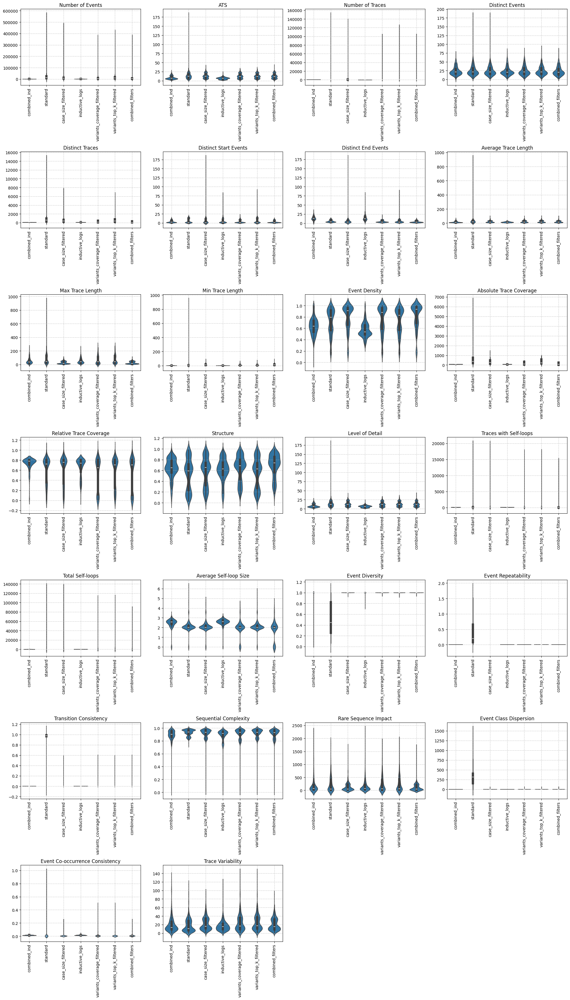


Summary Statistics:

Number of Events:
--------------------------------------------------
                            count        mean         std    min       max  \
combined_ind                519.0   1516.5877   1162.9293    0.0    6666.0   
standard                    566.0  21696.4028  41792.3197   48.0  561470.0   
case_size_filtered          567.0  14093.2593  32481.8608  102.0  475196.0   
inductive_logs              701.0   1293.4950    702.1851  100.0    3948.0   
variants_coverage_filtered  564.0  10393.9858  24148.4274   48.0  375152.0   
variants_top_k_filtered     564.0  16352.3457  30188.9754   48.0  415922.0   
combined_filters            545.0   7883.3523  25517.5705   86.0  375152.0   

                             median  
combined_ind                 1020.0  
standard                    12017.0  
case_size_filtered           7920.0  
inductive_logs               1198.0  
variants_coverage_filtered   5870.5  
variants_top_k_filtered      9555.0  
combined_filters  

In [ ]:
def visualize_property_distributions(root_path):
    """
    Iterate over folders and visualize distributions from new_properties_2.csv files.
    All violin plots are displayed together in one figure.
    
    Args:
        root_path (str): Path to the root folder containing subfolders
    """
    numeric_column_names = [
        'Number of Events', 'ATS', 'Number of Traces', 'Distinct Events',
        'Distinct Traces', 'Distinct Start Events', 'Distinct End Events',
        'Average Trace Length', 'Max Trace Length', 'Min Trace Length',
        'Event Density', 'Absolute Trace Coverage', 'Relative Trace Coverage',
        'Structure', 'Level of Detail', 'Traces with Self-loops',
        'Total Self-loops', 'Average Self-loop Size', 'Event Diversity',
        'Event Repeatability', 'Transition Consistency', 'Sequential Complexity',
        'Rare Sequence Impact', 'Event Class Dispersion',
        'Event Co-occurrence Consistency', 'Trace Variability'
    ]
    
    dfs = {}
    
    for folder_path in Path(root_path).iterdir():
        if not folder_path.is_dir() or folder_path.name.startswith('.'):
            continue
            
        csv_path = folder_path / 'new_properties_2.csv'
        if not csv_path.exists():
            print(f"No new_properties_2.csv found in {folder_path.name}")
            continue
            
        try:
            df = pd.read_csv(csv_path)
            
            for col in numeric_column_names:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
            
            dfs[folder_path.name] = df
            print(f"Successfully loaded and converted data from {folder_path.name}")
        except Exception as e:
            print(f"Error reading {csv_path}: {str(e)}")
            continue
    
    if not dfs:
        print("No data found to visualize")
        return
    
    common_columns = set.intersection(*[set(df.columns) for df in dfs.values()])
    numeric_columns = [col for col in numeric_column_names if col in common_columns]
    
    n_cols = 4  # Number of columns in the grid
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Ceiling division
    
    plt.figure(figsize=(20, 5 * n_rows))
    
    for idx, column in enumerate(numeric_columns, 1):
        plt.subplot(n_rows, n_cols, idx)
        
        all_values = []
        all_labels = []
        for label, df in dfs.items():
            values = df[column].dropna()
            all_values.extend(values)
            all_labels.extend([label] * len(values))
        
        sns.violinplot(x=all_labels, y=all_values)
        plt.title(column)
        plt.xticks(rotation=90)
        
        plt.grid(True, linestyle='--', alpha=0.7)
        
    plt.tight_layout()
    plt.show()
    
    print("\nSummary Statistics:")
    print("=" * 80)
    for column in numeric_columns:
        print(f"\n{column}:")
        print("-" * 50)
        stats_df = pd.DataFrame({
            name: {
                'count': df[column].count(),
                'mean': df[column].mean(),
                'std': df[column].std(),
                'min': df[column].min(),
                'max': df[column].max(),
                'median': df[column].median()
            }
            for name, df in dfs.items()
        }).T
        
        print(stats_df.round(4))

root_path = '/home/jupyter-benjamin.andrick-3cf07/test/logs'
visualize_property_distributions(root_path)

## Deviations

In [ ]:
def process_folder(base_folder):
    """
    Process a folder containing new_properties_2.csv and conformance_results.json
    """
    print(base_folder)
    if str(base_folder) == "/home/jupyter-benjamin.andrick-3cf07/test/logs/inductive_logs":
        conf_path = os.path.join(base_folder, 'conformance_results copy.json')
        props_path = os.path.join(base_folder, 'new_properties_2 copy.csv')
    else:
        conf_path = os.path.join(base_folder, 'conformance_results.json')
        props_path = os.path.join(base_folder, 'new_properties_2.csv')
    
    if not (os.path.exists(props_path) and os.path.exists(conf_path)):
        return None, None
    props_df = pd.read_csv(props_path)
    with open(conf_path, 'r') as f:
        conf_data = json.load(f)
        
    return props_df, conf_data

def flatten_conformance_data(json_data):
    """
    Flatten the conformance JSON data into a DataFrame
    """
    flattened_data = []
    for item in json_data:
        for filename, data in item.items():
            miners_data = data.get('conformance', data)
            for miner, metrics in miners_data.items():
                metrics_flat = {"file": filename, "miner": miner, **metrics}
                flattened_data.append(metrics_flat)
    return pd.DataFrame(flattened_data)

def process_all_folders(root_path):
    """
    Process all subfolders in the given root path
    """
    merged_dfs = {}
    
    for folder_path in Path(root_path).iterdir():
        if not folder_path.is_dir() or folder_path.name.startswith('.i'):
            continue
            
        folder_name = folder_path.name
        print(f"Processing folder: {folder_name}")
        
        props_df, conf_data = process_folder(folder_path)
        
        if props_df is None or conf_data is None:
            print(f"Skipping {folder_name} - missing required files")
            continue
        conf_df = flatten_conformance_data(conf_data)
        
        merged_df = pd.merge(
            conf_df,
            props_df,
            left_on='file',
            right_on='File',
            how='left'
        )
        
        merged_dfs[folder_name] = merged_df
        
    return merged_dfs

root_path = '/home/jupyter-benjamin.andrick-3cf07/test/logs'
merged_dfs = process_all_folders(root_path)

In [11]:
def add_key_column(df):
    
    if 'filename' in df.columns:
        df['Key'] = df['File'].str.extract(r'(.*?\.xes)', expand=False)
    else:
        xes_columns = [col for col in df.columns if df[col].astype(str).str.contains('.xes').any()]
        if xes_columns:
            df['Key'] = df[xes_columns[0]].str.extract(r'(.*?\.xes)', expand=False)
        else:
            print("Could not find a column containing filenames with .xes")
    return df


def extract_unique_properties(merged_dfs):
    """
    Extract specified columns from merged dataframes, ensuring unique filenames.
    
    Args:
        merged_dfs (dict): Dictionary of merged dataframes from process_all_folders()
        
    Returns:
        dict: Dictionary of processed dataframes with unique properties per file
    """
    columns_to_keep = [
        "Number of Events", "ATS", "Number of Traces", "Distinct Events",
        "Distinct Traces", "Distinct Start Events", "Distinct End Events",
        "Average Trace Length", "Max Trace Length", "Min Trace Length",
        "Event Density", "Absolute Trace Coverage", "Relative Trace Coverage",
        "Structure", "Level of Detail", "Traces with Self-loops",
        "Total Self-loops", "Average Self-loop Size", "Event Diversity",
        "Event Repeatability", "Transition Consistency", "Sequential Complexity",
        "Rare Sequence Impact", "Event Class Dispersion",
        "Event Co-occurrence Consistency", "Trace Variability", "File"
    ]
    
    processed_dfs = {}
    
    for df_name, df in merged_dfs.items():
        try:
            filename_col = 'File'
            existing_columns = [col for col in columns_to_keep if col in df.columns]
            processed_df = df[existing_columns].drop_duplicates(subset=[filename_col])
            processed_df = add_key_column(processed_df)
            
            processed_dfs[df_name] = processed_df
            
            print(f"Processed {df_name}: {len(processed_df)} unique files")
            print(f"Processed {df_name}: {processed_df['File'].nunique()} unique files")
            
            missing_columns = set(columns_to_keep) - set(existing_columns)
            if missing_columns:
                print(f"Warning: Missing columns in {df_name}: {missing_columns}")
                
        except Exception as e:
            print(f"Error processing {df_name}: {str(e)}")
            continue
    
    return processed_dfs



In [12]:
props_with_keys_df = extract_unique_properties(merged_dfs)

Processed combined_ind: 519 unique files
Processed combined_ind: 519 unique files
Processed standard: 548 unique files
Processed standard: 548 unique files
Processed case_size_filtered: 561 unique files
Processed case_size_filtered: 561 unique files
Processed inductive_logs: 561 unique files
Processed inductive_logs: 561 unique files
Processed variants_coverage_filtered: 563 unique files
Processed variants_coverage_filtered: 563 unique files
Processed variants_top_k_filtered: 543 unique files
Processed variants_top_k_filtered: 543 unique files
Processed combined_filters: 542 unique files
Processed combined_filters: 542 unique files


In [13]:
dfs_list = []

for preproc_type, df in props_with_keys_df.items():
    df_with_type = df.copy()
    df_with_type['preprocessing_type'] = preproc_type
    dfs_list.append(df_with_type)

all_props_df = pd.concat(dfs_list, ignore_index=True)

In [14]:
def transform_numeric_columns(df):
    """
    Transform numeric columns to appropriate data types (int or float) and round float values
    """
    int_columns = [
        'Number of Events',
        'Number of Traces',
        'Distinct Events',
        'Distinct Traces',
        'Distinct Start Events',
        'Distinct End Events',
        'Max Trace Length',
        'Min Trace Length'
    ]
    
    float_columns = [
        'ATS',
        'Average Trace Length',
        'Event Density',
        'Absolute Trace Coverage',
        'Relative Trace Coverage',
        'Event Diversity',
        'Event Repeatability',
        'Transition Consistency',
        'Sequential Complexity',
        'Rare Sequence Impact',
        'Event Class Dispersion',
        'Event Co-occurrence Consistency',
        'Trace Variability'
    ]
    
    for col in int_columns:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce').astype('Int64')
    
    for col in float_columns:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce').round(4).astype('float64')
    
    for col in df.columns:
        if col not in int_columns + float_columns and col not in ['File', 'Key', 'preprocessing_type']:
            try:
                if df[col].str.contains('.').any():  # Check if column contains decimal points
                    df[col] = pd.to_numeric(df[col], errors='coerce').round(4).astype('float64')
                else:
                    df[col] = pd.to_numeric(df[col], errors='coerce').astype('Int64')
            except:
                pass  # Keep as is if conversion fails
    
    return df

all_props_df = transform_numeric_columns(all_props_df)

In [15]:
def analyze_preprocessing_impact(df):
    grouped = df.groupby('Key')
    
    results = []
    
    metric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    
    for key, group in grouped:
        base_log = group[group['preprocessing_type'] == 'standard'].iloc[0] if any(group['preprocessing_type'] == 'standard') else None
        preprocessed_logs = group[group['preprocessing_type'] != 'standard']
        
        if base_log is not None:
            for _, prep_log in preprocessed_logs.iterrows():
                changes = {}
                changes['Key'] = key
                changes['Preprocessing'] = prep_log['preprocessing_type']
                
                for col in metric_columns:
                    if pd.notna(base_log[col]) and base_log[col] != 0:  # Avoid division by zero and NaN values
                        pct_change = ((prep_log[col] - base_log[col]) / base_log[col]) * 100
                        changes[f'{col}_pct_change'] = round(pct_change, 2)
                
                results.append(changes)
        else:
            print(f"No standard log found for key: {key}")
    
    results_df = pd.DataFrame(results)
    return results_df

results = analyze_preprocessing_impact(all_props_df)


No standard log found for key: pdc_2020_0100100.xes
No standard log found for key: pdc_2020_0200000.xes
No standard log found for key: pdc_2020_0200001.xes
No standard log found for key: pdc_2020_0200010.xes
No standard log found for key: pdc_2020_0200011.xes
No standard log found for key: pdc_2020_0200100.xes
No standard log found for key: pdc_2020_0200101.xes
No standard log found for key: pdc_2020_0210000.xes
No standard log found for key: pdc_2020_0210001.xes
No standard log found for key: pdc_2020_1200001.xes
No standard log found for key: pdc_2020_1200010.xes
No standard log found for key: pdc_2020_1200011.xes
No standard log found for key: pdc_2020_1200100.xes
No standard log found for key: pdc_2020_1200101.xes
No standard log found for key: pdc_2020_1200110.xes
No standard log found for key: pdc_2020_1200111.xes


In [16]:
def analyze_preprocessing_results(results_df):
    """
    Analyze and summarize the preprocessing impact results.
    
    Args:
        results_df (pd.DataFrame): DataFrame containing preprocessing comparison results
        
    Returns:
        dict: Summary statistics for each preprocessing type
    """
    pct_change_cols = [col for col in results_df.columns if col.endswith('_pct_change')]
    
    summary_stats = {}
    
    for prep_type in results_df['Preprocessing'].unique():
        prep_data = results_df[results_df['Preprocessing'] == prep_type]
        
        stats = {}
        for col in pct_change_cols:
            metric_name = col.replace('_pct_change', '')
            stats[metric_name] = {
                'mean_change': prep_data[col].mean(),
                'median_change': prep_data[col].median(),
                'std_change': prep_data[col].std(),
                'min_change': prep_data[col].min(),
                'max_change': prep_data[col].max()
            }
        
        summary_stats[prep_type] = stats
        
        print(f"\nPreprocessing Type: {prep_type}")
        print("=" * 50)
        for metric, values in stats.items():
            print(f"\n{metric}:")
            print(f"  Mean change: {values['mean_change']:.2f}%")
            print(f"  Median change: {values['median_change']:.2f}%")
            print(f"  Std deviation: {values['std_change']:.2f}%")
            print(f"  Range: [{values['min_change']:.2f}% to {values['max_change']:.2f}%]")
    
    return summary_stats

summary_stats = analyze_preprocessing_results(results)


Preprocessing Type: combined_ind

Number of Events:
  Mean change: -63.39%
  Median change: -90.40%
  Std deviation: 100.77%
  Range: [-100.00% to 1180.63%]

ATS:
  Mean change: -34.29%
  Median change: -32.95%
  Std deviation: 21.08%
  Range: [-100.00% to 55.93%]

Number of Traces:
  Mean change: -22.31%
  Median change: -90.00%
  Std deviation: 508.80%
  Range: [-99.93% to 9900.00%]

Distinct Events:
  Mean change: -4.89%
  Median change: 0.00%
  Std deviation: 10.75%
  Range: [-100.00% to 0.00%]

Distinct Traces:
  Mean change: -25.92%
  Median change: -85.29%
  Std deviation: 453.90%
  Range: [-99.82% to 9600.00%]

Distinct Start Events:
  Mean change: 14.63%
  Median change: 0.00%
  Std deviation: 102.25%
  Range: [-100.00% to 1200.00%]

Distinct End Events:
  Mean change: 230.71%
  Median change: 200.00%
  Std deviation: 234.06%
  Range: [-100.00% to 1400.00%]

Average Trace Length:
  Mean change: -13.53%
  Median change: -16.43%
  Std deviation: 53.13%
  Range: [-100.00% to 286

In [17]:
def create_summary_table(summary_stats):
    rows = []
    
    for prep_type, metrics in summary_stats.items():
        for metric, values in metrics.items():
            row = {
                'Preprocessing Type': prep_type,
                'Metric': metric,
                'Mean Change (%)': f"{values['mean_change']:.2f}",
                'Median Change (%)': f"{values['median_change']:.2f}",
                'Std Dev (%)': f"{values['std_change']:.2f}",
                'Min (%)': f"{values['min_change']:.2f}",
                'Max (%)': f"{values['max_change']:.2f}"
            }
            rows.append(row)
    
    df = pd.DataFrame(rows)
    df['Abs Mean'] = df['Mean Change (%)'].astype(float).abs()
    df = df.sort_values(['Preprocessing Type', 'Abs Mean'], ascending=[True, False])
    df = df.drop('Abs Mean', axis=1)
    
    return df.style.format(precision=2)\
                  .set_properties(**{'text-align': 'right'})\
                  .set_table_styles([
                      {'selector': 'th', 'props': [('text-align', 'left')]},
                      {'selector': '', 'props': [('border', '1px solid grey')]},
                      {'selector': 'th', 'props': [('background-color', '#f0f0f0')]},
                  ])

summary_table = create_summary_table(summary_stats)


/tmp/ipykernel_2084231/3748272722.py:21: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_array = annot_array.applymap(lambda x: f'{x:.2f}%')


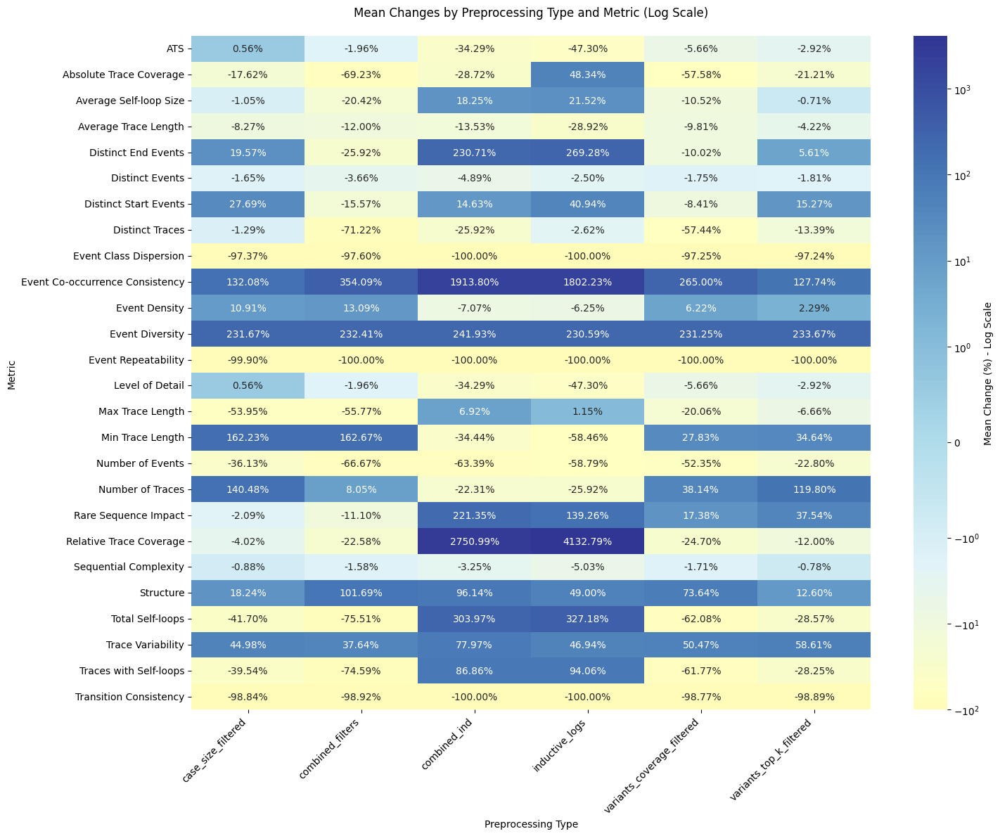

In [18]:
def visualize_correlation_matrix(summary_stats):
    rows = []
    for prep_type, metrics in summary_stats.items():
        for metric, values in metrics.items():
            row = {
                'Preprocessing Type': prep_type,
                'Metric': metric,
                'Mean Change': float(values['mean_change'])
            }
            rows.append(row)
    
    df = pd.DataFrame(rows)
    
    pivot_mean = df.pivot(index='Metric', 
                         columns='Preprocessing Type', 
                         values='Mean Change')
    
    plt.figure(figsize=(15, 12))
    
    annot_array = pivot_mean.copy()
    annot_array = annot_array.applymap(lambda x: f'{x:.2f}%')
    
    sns.heatmap(pivot_mean, 
                annot=annot_array,    # Use pre-formatted annotation array
                fmt='',              # Empty format as values are already formatted
                cmap='RdYlBu',       # Red-Yellow-Blue colormap
                center=0,            # Center colormap at 0
                norm=colors.SymLogNorm(linthresh=1, vmin=pivot_mean.min().min(), vmax=pivot_mean.max().max()),
                cbar_kws={'label': 'Mean Change (%) - Log Scale'}
               )
    
    plt.title('Mean Changes by Preprocessing Type and Metric (Log Scale)', pad=20)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    plt.tight_layout()
    
    plt.show()

from matplotlib import colors

visualize_correlation_matrix(summary_stats)

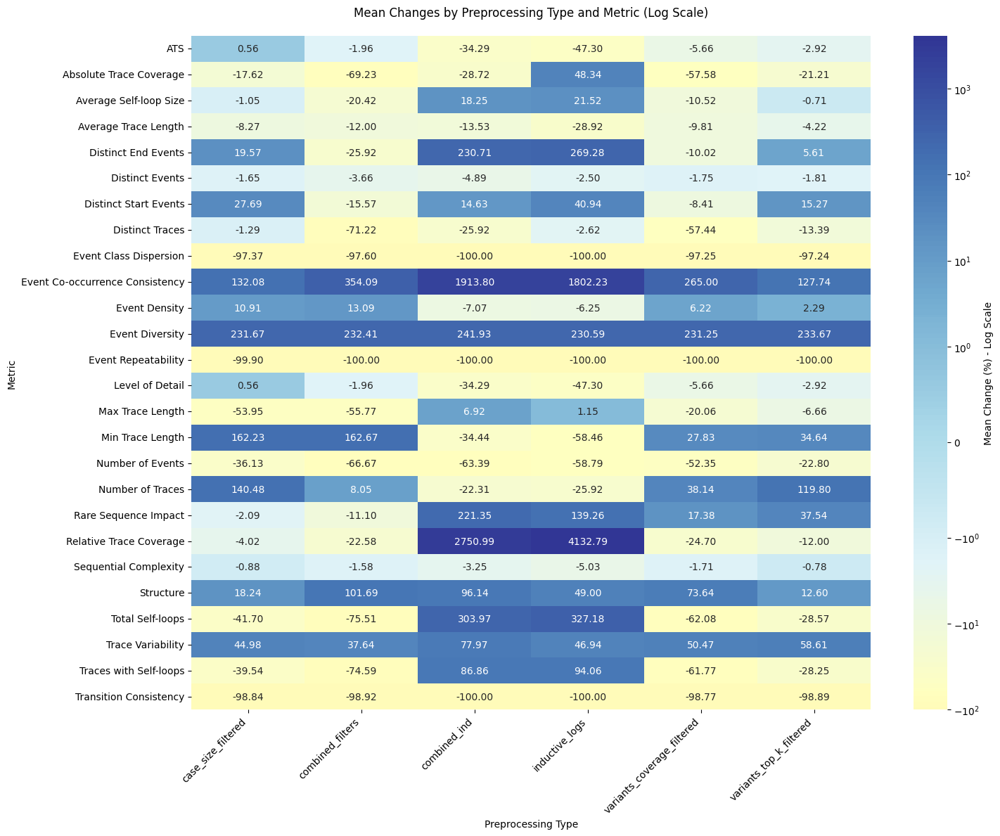

In [19]:
def visualize_correlation_matrix(summary_stats):
    rows = []
    for prep_type, metrics in summary_stats.items():
        for metric, values in metrics.items():
            row = {
                'Preprocessing Type': prep_type,
                'Metric': metric,
                'Mean Change': float(values['mean_change'])
            }
            rows.append(row)
    
    df = pd.DataFrame(rows)
    
    pivot_mean = df.pivot(index='Metric', 
                         columns='Preprocessing Type', 
                         values='Mean Change')
    
    plt.figure(figsize=(15, 12))
    
    sns.heatmap(pivot_mean, 
                annot=True,           # Show values in cells
                fmt='.2f',           # Format numbers to 2 decimal places
                cmap='RdYlBu',       # Red-Yellow-Blue colormap
                center=0,            # Center colormap at 0
                norm=colors.SymLogNorm(linthresh=1, vmin=pivot_mean.min().min(), vmax=pivot_mean.max().max()),
                cbar_kws={'label': 'Mean Change (%) - Log Scale'}
               )
    
    plt.title('Mean Changes by Preprocessing Type and Metric (Log Scale)', pad=20)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    plt.tight_layout()
    
    plt.show()

from matplotlib import colors

visualize_correlation_matrix(summary_stats)

In [20]:
def export_summary_table_to_csv(summary_stats, filename='summary_table.csv'):
    rows = []
    
    for prep_type, metrics in summary_stats.items():
        for metric, values in metrics.items():
            row = {
                'Preprocessing Type': prep_type,
                'Metric': metric,
                'Mean Change (%)': f"{values['mean_change']:.2f}",
                'Median Change (%)': f"{values['median_change']:.2f}",
                'Std Dev (%)': f"{values['std_change']:.2f}",
                'Min (%)': f"{values['min_change']:.2f}",
                'Max (%)': f"{values['max_change']:.2f}"
            }
            rows.append(row)
    
    df = pd.DataFrame(rows)
    df['Abs Mean'] = df['Mean Change (%)'].astype(float).abs()
    df = df.sort_values(['Preprocessing Type', 'Abs Mean'], ascending=[True, False])
    df = df.drop('Abs Mean', axis=1)
    
    df.to_csv(filename, index=False)

export_summary_table_to_csv(summary_stats, 'summary_table.csv')

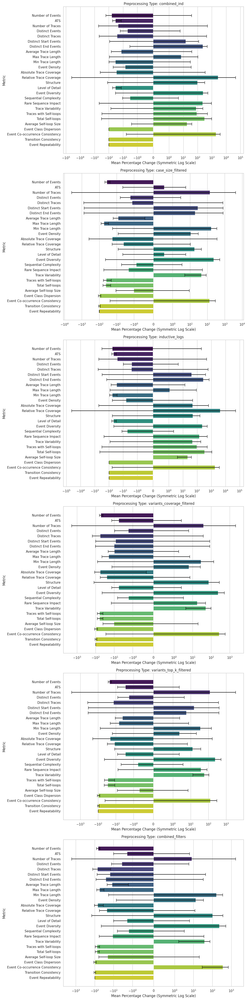

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def visualize_preprocessing_summary(summary_stats):
    """
    Visualize the summary statistics of preprocessing impact using a symmetric logarithmic scale.
    
    Args:
        summary_stats (dict): Summary statistics for each preprocessing type
    """
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(len(summary_stats), 1, figsize=(12, 8 * len(summary_stats)))
    
    if len(summary_stats) == 1:
        axes = [axes]  # Ensure axes is iterable if there's only one plot
    
    for ax, (prep_type, metrics) in zip(axes, summary_stats.items()):
        data = {
            'Metric': [],
            'Mean Change (%)': [],
            'Std Deviation (%)': []
        }
        
        for metric, values in metrics.items():
            data['Metric'].append(metric)
            data['Mean Change (%)'].append(values['mean_change'])
            data['Std Deviation (%)'].append(values['std_change'])
        
        plot_df = pd.DataFrame(data)
        
        sns.barplot(x='Mean Change (%)', y='Metric', hue='Metric', data=plot_df, ax=ax, palette='viridis', dodge=False, legend=False)
        ax.errorbar(plot_df['Mean Change (%)'], plot_df['Metric'], xerr=plot_df['Std Deviation (%)'], fmt='none', c='black', capsize=5)
        
        ax.set_title(f'Preprocessing Type: {prep_type}')
        ax.set_xlabel('Mean Percentage Change (Symmetric Log Scale)')
        ax.set_ylabel('Metric')
        
        ax.set_xscale('symlog', linthresh=1)
    
    plt.tight_layout()
    plt.show()

visualize_preprocessing_summary(summary_stats)

In [22]:
def visualize_preprocessing_summary(summary_stats):
    """
    Visualize the summary statistics of preprocessing impact using a symmetric logarithmic scale.
    Saves each preprocessing type visualization as a separate file.
    
    Args:
        summary_stats (dict): Summary statistics for each preprocessing type
    """
    sns.set(style="whitegrid")
    
    for prep_type, metrics in summary_stats.items():
        plt.figure(figsize=(12, 8))
        
        data = {
            'Metric': [],
            'Mean Change (%)': [],
            'Std Deviation (%)': []
        }
        
        for metric, values in metrics.items():
            data['Metric'].append(metric)
            data['Mean Change (%)'].append(values['mean_change'])
            data['Std Deviation (%)'].append(values['std_change'])
        
        plot_df = pd.DataFrame(data)
        
        sns.barplot(x='Mean Change (%)', y='Metric', hue='Metric', 
                   data=plot_df, palette='viridis', dodge=False, legend=False)
        
        plt.errorbar(plot_df['Mean Change (%)'], plot_df['Metric'], 
                    xerr=plot_df['Std Deviation (%)'], fmt='none', c='black', capsize=5)
        
        plt.title(f'Preprocessing Impact: {prep_type}')
        plt.xlabel('Mean Percentage Change (Symmetric Log Scale)')
        plt.ylabel('Metric')
        
        plt.gca().set_xscale('symlog', linthresh=1)
        
        plt.tight_layout()
        
        filename = f'preprocessing_impact_{prep_type}.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.close()  # Close the figure to free memory
        
        print(f"Saved visualization for {prep_type} to {filename}")

visualize_preprocessing_summary(summary_stats)

Saved visualization for combined_ind to preprocessing_impact_combined_ind.png
Saved visualization for case_size_filtered to preprocessing_impact_case_size_filtered.png
Saved visualization for inductive_logs to preprocessing_impact_inductive_logs.png
Saved visualization for variants_coverage_filtered to preprocessing_impact_variants_coverage_filtered.png
Saved visualization for variants_top_k_filtered to preprocessing_impact_variants_top_k_filtered.png
Saved visualization for combined_filters to preprocessing_impact_combined_filters.png


# Corr Matrix Analysis


## Corr Matrix Abhängig von preprocessing und Miner

In [ ]:
corr_matrix_miner_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/CorrMatrix_Miner'
corr_matrix_miner_x_prepro_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/CorrMatrix_Miner_X_Preprocessing_type'

In [ ]:
import os

corr_matrix_miner_x_prepro_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/CorrMatrix_Miner_X_Preprocessing_type'

sorted_files = {}

for filename in os.listdir(corr_matrix_miner_x_prepro_path):
    if filename.endswith('.csv'):
        
        parts = filename.replace('_values_correlation_matrix.csv', '').split('_')
        preprocessing_type = '_'.join(part for part in parts[1:] if 'original' not in part)
        algorithm = parts[0]
        
        
        if algorithm not in sorted_files:
            sorted_files[algorithm] = {}
        if preprocessing_type not in sorted_files[algorithm]:
            sorted_files[algorithm][preprocessing_type] = []
        
        sorted_files[algorithm][preprocessing_type].append(
            os.path.join(corr_matrix_miner_x_prepro_path, filename)
        )


### 1. Highest Correlations nach prepr und Miner

In [25]:
miner_top_correlations = {}

for miner, preproc_dict in sorted_files.items():
    top_n_values = []
    N = 10  # Number of top correlations to track per miner
    
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            np.fill_diagonal(abs_df.values, 0)  # Exclude diagonal
            
            max_value = abs_df.max().max()
            
            if max_value > 0:
                max_loc = abs_df.stack().idxmax()
                metric1, metric2 = max_loc
                
                entry = {
                    'value': max_value,
                    'preprocessing': preproc,
                    'metric1': metric1,
                    'metric2': metric2,
                    'original_value': df.loc[metric1, metric2],
                    'file': file_path
                }
                
                top_n_values.append(entry)
                top_n_values = sorted(top_n_values, key=lambda x: abs(x['value']), reverse=True)[:N]
    
    miner_top_correlations[miner] = top_n_values

print("\nTOP CORRELATIONS BY MINER")
print("=" * 100)

for miner, correlations in miner_top_correlations.items():
    print(f"\n{miner}")
    print("-" * 50)
    
    property_counts = {}
    for entry in correlations:
        property_counts[entry['metric1']] = property_counts.get(entry['metric1'], 0) + 1
        property_counts[entry['metric2']] = property_counts.get(entry['metric2'], 0) + 1
    
    sorted_properties = sorted(property_counts.items(), key=lambda x: x[1], reverse=True)
    
    print("\nMost frequent properties:")
    for prop, count in sorted_properties[:5]:  # Top 5 properties
        print(f"{prop}: {count} appearances")
    
    print("\nTop correlations:")
    for idx, entry in enumerate(correlations[:5], 1):  # Top 5 correlations
        print(f"\nRank {idx}:")
        print(f"Correlation: {abs(entry['value']):.4f} ({entry['original_value']:.4f})")
        print(f"Properties: {entry['metric1']} <-> {entry['metric2']}")
        print(f"Preprocessing: {entry['preprocessing']}")
        print(f"File: {os.path.basename(entry['file'])}")
    
    print("=" * 100)

print("\nOVERALL PROPERTY FREQUENCY ACROSS ALL MINERS")
print("=" * 50)
all_property_counts = {}

for miner, correlations in miner_top_correlations.items():
    for entry in correlations:
        all_property_counts[entry['metric1']] = all_property_counts.get(entry['metric1'], 0) + 1
        all_property_counts[entry['metric2']] = all_property_counts.get(entry['metric2'], 0) + 1

sorted_overall = sorted(all_property_counts.items(), key=lambda x: x[1], reverse=True)
print("\nTop 10 most frequent properties across all miners:")
for prop, count in sorted_overall[:10]:
    print(f"{prop}: {count} appearances")


TOP CORRELATIONS BY MINER

ILP Miner
--------------------------------------------------

Most frequent properties:
Sequential Complexity: 5 appearances
fscore: 5 appearances
Distinct Traces: 1 appearances
precision: 1 appearances
Event Co-occurrence Consistency: 1 appearances

Top correlations:

Rank 1:
Correlation: 0.8724 (-0.8724)
Properties: Sequential Complexity <-> fscore
Preprocessing: standard
File: ILP Miner_standard_original_values_correlation_matrix.csv

Rank 2:
Correlation: 0.8525 (-0.8525)
Properties: Distinct Traces <-> precision
Preprocessing: combined_ind
File: ILP Miner_combined_ind_original_values_correlation_matrix.csv

Rank 3:
Correlation: 0.7945 (-0.7945)
Properties: Sequential Complexity <-> fscore
Preprocessing: variants_top_k_filtered
File: ILP Miner_variants_top_k_filtered_original_values_correlation_matrix.csv

Rank 4:
Correlation: 0.7911 (-0.7911)
Properties: Sequential Complexity <-> fscore
Preprocessing: inductive_logs
File: ILP Miner_inductive_logs_origina

### 2. Most influencial Properties und Metrics

In [26]:
miner_totals = {}

for miner, preproc_dict in sorted_files.items():
    all_row_sums = {}
    all_col_sums = {}
    file_count = 0
    
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            row_sums = df.abs().sum(axis=1)
            col_sums = df.abs().sum(axis=0)
            
            for metric in row_sums.index:
                all_row_sums[metric] = all_row_sums.get(metric, 0) + row_sums[metric]
            for metric in col_sums.index:
                all_col_sums[metric] = all_col_sums.get(metric, 0) + col_sums[metric]
            
            file_count += 1
    
    avg_row_sums = {k: v/file_count for k, v in all_row_sums.items()}
    avg_col_sums = {k: v/file_count for k, v in all_col_sums.items()}
    
    miner_totals[miner] = {
        'average_row_sums': avg_row_sums,
        'average_col_sums': avg_col_sums,
        'total_row_sums': all_row_sums,
        'total_col_sums': all_col_sums,
        'file_count': file_count
    }

print("\nTOP PROPERTIES BY SUMS FOR EACH MINER")
print("=" * 100)

for miner, totals in miner_totals.items():
    print(f"\n{miner}")
    print("-" * 50)
    
    row_sums = totals['average_row_sums']
    col_sums = totals['average_col_sums']
    
    sorted_by_row = sorted(row_sums.items(), key=lambda x: x[1], reverse=True)
    sorted_by_col = sorted(col_sums.items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 5 Properties by Row Sums (properties that correlate most strongly with others):")
    for prop, sum_value in sorted_by_row[:5]:
        print(f"{prop}: {sum_value:.2f}")
    
    print("\nTop 5 Properties by Column Sums (properties that others correlate strongly with):")
    for prop, sum_value in sorted_by_col[:5]:
        print(f"{prop}: {sum_value:.2f}")
    
    
    
    print("=" * 100)




TOP PROPERTIES BY SUMS FOR EACH MINER

ILP Miner
--------------------------------------------------

Top 5 Properties by Row Sums (properties that correlate most strongly with others):
Relative Trace Coverage: 2.74
Distinct Events: 2.61
ATS: 2.55
Level of Detail: 2.55
Sequential Complexity: 2.51

Top 5 Properties by Column Sums (properties that others correlate strongly with):
fscore: 10.12
precision: 9.55
metricsAverageWeight: 8.11
simplicity: 6.55
generalization: 5.08

Heuristic Miner - Plus
--------------------------------------------------

Top 5 Properties by Row Sums (properties that correlate most strongly with others):
Event Density: 3.30
Average Self-loop Size: 3.27
Total Self-loops: 3.18
Absolute Trace Coverage: 2.81
Relative Trace Coverage: 2.74

Top 5 Properties by Column Sums (properties that others correlate strongly with):
precision: 7.23
fscore: 7.05
metricsAverageWeight: 6.70
perc_fit_traces: 6.15
percentage_of_fitting_traces: 6.15

Alpha Miner - Classic
-------------

### 3. Algorithmus mit highest overall correlation

In [27]:
preprocessing_correlations = {}

for miner, preproc_dict in sorted_files.items():
    for preproc, file_paths in preproc_dict.items():
        if preproc not in preprocessing_correlations:
            preprocessing_correlations[preproc] = {}
            
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            np.fill_diagonal(abs_df.values, 0)  # Exclude diagonal
            
            total_correlation = abs_df.sum().sum() / 2  # Divide by 2 as matrix is symmetric
            
            if miner not in preprocessing_correlations[preproc]:
                preprocessing_correlations[preproc][miner] = {
                    'total_correlation': 0,
                    'max_correlation': 0,
                    'avg_correlation': 0,
                    'correlation_count': 0
                }
            
            preprocessing_correlations[preproc][miner]['total_correlation'] += total_correlation
            preprocessing_correlations[preproc][miner]['max_correlation'] = max(
                preprocessing_correlations[preproc][miner]['max_correlation'],
                abs_df.max().max()
            )
            preprocessing_correlations[preproc][miner]['correlation_count'] += (abs_df > 0).sum().sum() / 2
            preprocessing_correlations[preproc][miner]['avg_correlation'] = (
                preprocessing_correlations[preproc][miner]['total_correlation'] / 
                preprocessing_correlations[preproc][miner]['correlation_count']
                if preprocessing_correlations[preproc][miner]['correlation_count'] > 0 else 0
            )

print("\nCORRELATION ANALYSIS BY PREPROCESSING TYPE")
print("=" * 100)

for preproc, miners in preprocessing_correlations.items():
    print(f"\nPreprocessing Type: {preproc}")
    print("-" * 50)
    
    sorted_by_total = sorted(miners.items(), key=lambda x: x[1]['total_correlation'], reverse=True)
    sorted_by_max = sorted(miners.items(), key=lambda x: x[1]['max_correlation'], reverse=True)
    sorted_by_avg = sorted(miners.items(), key=lambda x: x[1]['avg_correlation'], reverse=True)
    
    print("\nTop Miners by Total Correlation:")
    for miner, stats in sorted_by_total[:3]:  # Show top 3
        print(f"{miner}:")
        print(f"  Total Correlation: {stats['total_correlation']:.4f}")
        print(f"  Number of Correlations: {stats['correlation_count']:.0f}")
    
    print("\nTop Miners by Maximum Correlation:")
    for miner, stats in sorted_by_max[:3]:  # Show top 3
        print(f"{miner}:")
        print(f"  Maximum Correlation: {stats['max_correlation']:.4f}")
    
    print("\nTop Miners by Average Correlation:")
    for miner, stats in sorted_by_avg[:3]:  # Show top 3
        print(f"{miner}:")
        print(f"  Average Correlation: {stats['avg_correlation']:.4f}")
    
    print("=" * 100)

print("\nOVERALL BEST PERFORMERS")
print("=" * 50)

overall_stats = {}
for preproc, miners in preprocessing_correlations.items():
    for miner, stats in miners.items():
        if miner not in overall_stats:
            overall_stats[miner] = {
                'total_correlation': 0,
                'max_correlation': 0,
                'avg_correlation': 0,
                'correlation_count': 0
            }
        
        overall_stats[miner]['total_correlation'] += stats['total_correlation']
        overall_stats[miner]['max_correlation'] = max(
            overall_stats[miner]['max_correlation'],
            stats['max_correlation']
        )
        overall_stats[miner]['correlation_count'] += stats['correlation_count']

for miner in overall_stats:
    overall_stats[miner]['avg_correlation'] = (
        overall_stats[miner]['total_correlation'] / 
        overall_stats[miner]['correlation_count']
        if overall_stats[miner]['correlation_count'] > 0 else 0
    )

sorted_overall = sorted(overall_stats.items(), key=lambda x: x[1]['total_correlation'], reverse=True)
print("\nOverall Best Performers (across all preprocessing types):")
for miner, stats in sorted_overall:
    print(f"\n{miner}:")
    print(f"  Total Correlation: {stats['total_correlation']:.4f}")
    print(f"  Maximum Correlation: {stats['max_correlation']:.4f}")
    print(f"  Average Correlation: {stats['avg_correlation']:.4f}")
    


CORRELATION ANALYSIS BY PREPROCESSING TYPE

Preprocessing Type: inductive_logs
--------------------------------------------------

Top Miners by Total Correlation:
Alpha Miner - Classic:
  Total Correlation: 27.8135
  Number of Correlations: 100
Heuristic Miner - Classic:
  Total Correlation: 25.6936
  Number of Correlations: 100
Heuristic Miner - Plus:
  Total Correlation: 25.4774
  Number of Correlations: 100

Top Miners by Maximum Correlation:
Heuristic Miner - Plus:
  Maximum Correlation: 0.8308
ILP Miner:
  Maximum Correlation: 0.7911
Alpha Miner - Plus:
  Maximum Correlation: 0.7528

Top Miners by Average Correlation:
ILP Miner:
  Average Correlation: 0.3249
Alpha Miner - Classic:
  Average Correlation: 0.2795
Heuristic Miner - Classic:
  Average Correlation: 0.2582

Preprocessing Type: combined_filters
--------------------------------------------------

Top Miners by Total Correlation:
Heuristic Miner - Plus:
  Total Correlation: 28.2768
  Number of Correlations: 108
Alpha Mine

### olddd bis neuer Corr Typ

In [28]:
import pandas as pd
import numpy as np

results = {
    'miner': [],
    'preprocessing': [],
    'row_sums': [],
    'column_sums': []
}

for miner, preproc_dict in sorted_files.items():
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            row_sums = df.abs().sum(axis=1)
            col_sums = df.abs().sum(axis=0)
            
            results['miner'].append(miner)
            results['preprocessing'].append(preproc)
            results['row_sums'].append(row_sums.to_dict())
            results['column_sums'].append(col_sums.to_dict())

results_df = pd.DataFrame(results)

print("Results for each miner and preprocessing technique:")
for _, row in results_df.iterrows():
    print(f"\nMiner: {row['miner']}")
    print(f"Preprocessing: {row['preprocessing']}")
    print("\nRow sums:")
    for metric, value in row['row_sums'].items():
        print(f"{metric}: {value:.2f}")
    print("\nColumn sums:")
    for metric, value in row['column_sums'].items():
        print(f"{metric}: {value:.2f}")
    print("-" * 50)

Results for each miner and preprocessing technique:

Miner: ILP Miner
Preprocessing: inductive_logs

Row sums:
Number of Events: 2.29
ATS: 2.44
Number of Traces: 0.00
Distinct Events: 2.84
Distinct Traces: 2.07
Distinct Start Events: 0.27
Distinct End Events: 1.43
Average Trace Length: 2.29
Max Trace Length: 2.20
Min Trace Length: 0.91
Event Density: 1.15
Absolute Trace Coverage: 1.95
Relative Trace Coverage: 1.95
Structure: 1.40
Level of Detail: 2.44
Traces with Self-loops: 1.00
Total Self-loops: 1.01
Average Self-loop Size: 1.15
Event Diversity: 0.54
Event Repeatability: 0.00
Transition Consistency: 0.06
Sequential Complexity: 2.76
Rare Sequence Impact: 1.82
Event Class Dispersion: 0.00
Event Co-occurrence Consistency: 2.22
Trace Variability: 1.85

Column sums:
average_trace_fitness: 0.00
fscore: 9.83
generalization: 7.34
log_fitness: 0.00
metricsAverageWeight: 6.17
perc_fit_traces: 0.00
percentage_of_fitting_traces: 0.00
precision: 9.30
simplicity: 5.40
-----------------------------

### Welche Metriken bzw Eigenschaften weisen für die jeweiligen preprocessing types die höchste absolute Summe auf?

In [29]:
miner_totals = {}

for miner, preproc_dict in sorted_files.items():
    all_row_sums = {}
    all_col_sums = {}
    file_count = 0
    
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            row_sums = df.abs().sum(axis=1)
            col_sums = df.abs().sum(axis=0)
            
            for metric in row_sums.index:
                all_row_sums[metric] = all_row_sums.get(metric, 0) + row_sums[metric]
            for metric in col_sums.index:
                all_col_sums[metric] = all_col_sums.get(metric, 0) + col_sums[metric]
            
            file_count += 1
    
    avg_row_sums = {k: v/file_count for k, v in all_row_sums.items()}
    avg_col_sums = {k: v/file_count for k, v in all_col_sums.items()}
    
    miner_totals[miner] = {
        'average_row_sums': avg_row_sums,
        'average_col_sums': avg_col_sums,
        'total_row_sums': all_row_sums,
        'total_col_sums': all_col_sums,
        'file_count': file_count
    }

print("\nTOTALS PER MINER")
print("=" * 80)
for miner, totals in miner_totals.items():
    print(f"\n{miner} (processed {totals['file_count']} files)")
    print("-" * 40)
    
    print("\nAverage Row Sums:")
    for metric, value in totals['average_row_sums'].items():
        print(f"{metric}: {value:.2f}")
    
    print("\nAverage Column Sums:")
    for metric, value in totals['average_col_sums'].items():
        print(f"{metric}: {value:.2f}")
    
    print("\nTotal Row Sums:")
    for metric, value in totals['total_row_sums'].items():
        print(f"{metric}: {value:.2f}")
    
    print("\nTotal Column Sums:")
    for metric, value in totals['total_col_sums'].items():
        print(f"{metric}: {value:.2f}")
    
    print("=" * 80)


TOTALS PER MINER

ILP Miner (processed 7 files)
----------------------------------------

Average Row Sums:
Number of Events: 1.68
ATS: 2.55
Number of Traces: 0.97
Distinct Events: 2.61
Distinct Traces: 1.48
Distinct Start Events: 0.45
Distinct End Events: 1.23
Average Trace Length: 2.03
Max Trace Length: 2.10
Min Trace Length: 1.11
Event Density: 1.31
Absolute Trace Coverage: 1.66
Relative Trace Coverage: 2.74
Structure: 1.08
Level of Detail: 2.55
Traces with Self-loops: 1.28
Total Self-loops: 1.26
Average Self-loop Size: 1.37
Event Diversity: 1.04
Event Repeatability: 0.30
Transition Consistency: 0.67
Sequential Complexity: 2.51
Rare Sequence Impact: 1.68
Event Class Dispersion: 0.59
Event Co-occurrence Consistency: 1.36
Trace Variability: 1.82

Average Column Sums:
average_trace_fitness: 0.00
fscore: 10.12
generalization: 5.08
log_fitness: 0.00
metricsAverageWeight: 8.11
perc_fit_traces: 0.00
percentage_of_fitting_traces: 0.00
precision: 9.55
simplicity: 6.55

Total Row Sums:
Numbe

### Was sind die Absolut höchsten Werte in der Corr Matrix?

In [30]:
highest_values = {
    'value': 0,
    'miner': '',
    'preprocessing': '',
    'metric1': '',
    'metric2': '',
    'file': ''
}

top_n_values = []
N = 20  # Number of top values to track

for miner, preproc_dict in sorted_files.items():
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            
            np.fill_diagonal(abs_df.values, 0)  # Set diagonal to 0
            max_value = abs_df.max().max()
            
            if max_value > 0:  # Only consider non-zero values
                max_loc = abs_df.stack().idxmax()
                metric1, metric2 = max_loc
                
                entry = {
                    'value': max_value,
                    'miner': miner,
                    'preprocessing': preproc,
                    'metric1': metric1,
                    'metric2': metric2,
                    'file': file_path,
                    'original_value': df.loc[metric1, metric2]  # Get the original (signed) value
                }
                
                top_n_values.append(entry)
                top_n_values = sorted(top_n_values, key=lambda x: abs(x['value']), reverse=True)[:N]

results_df = pd.DataFrame(top_n_values)

print(f"\nTop {N} Highest Absolute Correlation Values:")
print("=" * 100)
for idx, row in results_df.iterrows():
    print(f"\nRank {idx + 1}:")
    print(f"Absolute Value: {abs(row['value']):.4f}")
    print(f"Original Value: {row['original_value']:.4f}")
    print(f"Miner: {row['miner']}")
    print(f"Preprocessing: {row['preprocessing']}")
    print(f"Metrics: {row['metric1']} <-> {row['metric2']}")
    print(f"File: {os.path.basename(row['file'])}")
    print("-" * 50)




Top 20 Highest Absolute Correlation Values:

Rank 1:
Absolute Value: 0.8724
Original Value: -0.8724
Miner: ILP Miner
Preprocessing: standard
Metrics: Sequential Complexity <-> fscore
File: ILP Miner_standard_original_values_correlation_matrix.csv
--------------------------------------------------

Rank 2:
Absolute Value: 0.8525
Original Value: -0.8525
Miner: ILP Miner
Preprocessing: combined_ind
Metrics: Distinct Traces <-> precision
File: ILP Miner_combined_ind_original_values_correlation_matrix.csv
--------------------------------------------------

Rank 3:
Absolute Value: 0.8308
Original Value: 0.8308
Miner: Heuristic Miner - Plus
Preprocessing: inductive_logs
Metrics: Structure <-> average_trace_fitness
File: Heuristic Miner - Plus_inductive_logs_original_values_correlation_matrix.csv
--------------------------------------------------

Rank 4:
Absolute Value: 0.7962
Original Value: -0.7962
Miner: Heuristic Miner - Plus
Preprocessing: combined_ind
Metrics: Distinct Traces <-> perc_

In [31]:
highest_values = {
    'value': 0,
    'miner': '',
    'preprocessing': '',
    'metric1': '',
    'metric2': '',
    'file': ''
}

top_n_values = []
N = 20  # Increased to get a better sample size

for miner, preproc_dict in sorted_files.items():
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            
            np.fill_diagonal(abs_df.values, 0)  # Set diagonal to 0
            max_value = abs_df.max().max()
            
            if max_value > 0:  # Only consider non-zero values
                max_loc = abs_df.stack().idxmax()
                metric1, metric2 = max_loc
                
                entry = {
                    'value': max_value,
                    'miner': miner,
                    'preprocessing': preproc,
                    'metric1': metric1,
                    'metric2': metric2,
                    'file': file_path,
                    'original_value': df.loc[metric1, metric2]  # Get the original (signed) value
                }
                
                top_n_values.append(entry)
                top_n_values = sorted(top_n_values, key=lambda x: abs(x['value']), reverse=True)[:N]

results_df = pd.DataFrame(top_n_values)

property_counts = {}
for _, row in results_df.iterrows():
    property_counts[row['metric1']] = property_counts.get(row['metric1'], 0) + 1
    property_counts[row['metric2']] = property_counts.get(row['metric2'], 0) + 1

sorted_properties = sorted(property_counts.items(), key=lambda x: x[1], reverse=True)

print("\nMost Frequent Properties in Top Correlations:")
print("=" * 80)
for property_name, count in sorted_properties:
    print(f"{property_name}: {count} appearances")

print("\nDetailed Correlations for Most Frequent Properties:")
print("=" * 80)
top_properties = [p[0] for p in sorted_properties[:5]]  # Get top 5 properties
for prop in top_properties:
    print(f"\nCorrelations involving {prop}:")
    relevant_rows = results_df[
        (results_df['metric1'] == prop) | 
        (results_df['metric2'] == prop)
    ]
    for _, row in relevant_rows.iterrows():
        print(f"\nCorrelation: {abs(row['value']):.4f}")
        print(f"With: {row['metric2'] if row['metric1'] == prop else row['metric1']}")
        print(f"Miner: {row['miner']}")
        print(f"Preprocessing: {row['preprocessing']}")
        print("-" * 40)


Most Frequent Properties in Top Correlations:
Sequential Complexity: 7 appearances
Structure: 7 appearances
average_trace_fitness: 6 appearances
fscore: 5 appearances
precision: 5 appearances
Distinct Traces: 3 appearances
simplicity: 3 appearances
Average Self-loop Size: 2 appearances
perc_fit_traces: 1 appearances
Transition Consistency: 1 appearances

Detailed Correlations for Most Frequent Properties:

Correlations involving Sequential Complexity:

Correlation: 0.8724
With: fscore
Miner: ILP Miner
Preprocessing: standard
----------------------------------------

Correlation: 0.7945
With: fscore
Miner: ILP Miner
Preprocessing: variants_top_k_filtered
----------------------------------------

Correlation: 0.7911
With: fscore
Miner: ILP Miner
Preprocessing: inductive_logs
----------------------------------------

Correlation: 0.7797
With: fscore
Miner: ILP Miner
Preprocessing: variants_coverage_filtered
----------------------------------------

Correlation: 0.7730
With: fscore
Miner:

In [32]:
miner_top_correlations = {}

for miner, preproc_dict in sorted_files.items():
    top_n_values = []
    N = 10  # Number of top correlations to track per miner
    
    for preproc, file_paths in preproc_dict.items():
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            np.fill_diagonal(abs_df.values, 0)  # Exclude diagonal
            
            max_value = abs_df.max().max()
            
            if max_value > 0:
                max_loc = abs_df.stack().idxmax()
                metric1, metric2 = max_loc
                
                entry = {
                    'value': max_value,
                    'preprocessing': preproc,
                    'metric1': metric1,
                    'metric2': metric2,
                    'original_value': df.loc[metric1, metric2],
                    'file': file_path
                }
                
                top_n_values.append(entry)
                top_n_values = sorted(top_n_values, key=lambda x: abs(x['value']), reverse=True)[:N]
    
    miner_top_correlations[miner] = top_n_values

print("\nTOP CORRELATIONS BY MINER")
print("=" * 100)

for miner, correlations in miner_top_correlations.items():
    print(f"\n{miner}")
    print("-" * 50)
    
    property_counts = {}
    for entry in correlations:
        property_counts[entry['metric1']] = property_counts.get(entry['metric1'], 0) + 1
        property_counts[entry['metric2']] = property_counts.get(entry['metric2'], 0) + 1
    
    sorted_properties = sorted(property_counts.items(), key=lambda x: x[1], reverse=True)
    
    print("\nMost frequent properties:")
    for prop, count in sorted_properties[:5]:  # Top 5 properties
        print(f"{prop}: {count} appearances")
    
    print("\nTop correlations:")
    for idx, entry in enumerate(correlations[:5], 1):  # Top 5 correlations
        print(f"\nRank {idx}:")
        print(f"Correlation: {abs(entry['value']):.4f} ({entry['original_value']:.4f})")
        print(f"Properties: {entry['metric1']} <-> {entry['metric2']}")
        print(f"Preprocessing: {entry['preprocessing']}")
        print(f"File: {os.path.basename(entry['file'])}")
    
    print("=" * 100)

print("\nOVERALL PROPERTY FREQUENCY ACROSS ALL MINERS")
print("=" * 50)
all_property_counts = {}

for miner, correlations in miner_top_correlations.items():
    for entry in correlations:
        all_property_counts[entry['metric1']] = all_property_counts.get(entry['metric1'], 0) + 1
        all_property_counts[entry['metric2']] = all_property_counts.get(entry['metric2'], 0) + 1

sorted_overall = sorted(all_property_counts.items(), key=lambda x: x[1], reverse=True)
print("\nTop 10 most frequent properties across all miners:")
for prop, count in sorted_overall[:10]:
    print(f"{prop}: {count} appearances")


TOP CORRELATIONS BY MINER

ILP Miner
--------------------------------------------------

Most frequent properties:
Sequential Complexity: 5 appearances
fscore: 5 appearances
Distinct Traces: 1 appearances
precision: 1 appearances
Event Co-occurrence Consistency: 1 appearances

Top correlations:

Rank 1:
Correlation: 0.8724 (-0.8724)
Properties: Sequential Complexity <-> fscore
Preprocessing: standard
File: ILP Miner_standard_original_values_correlation_matrix.csv

Rank 2:
Correlation: 0.8525 (-0.8525)
Properties: Distinct Traces <-> precision
Preprocessing: combined_ind
File: ILP Miner_combined_ind_original_values_correlation_matrix.csv

Rank 3:
Correlation: 0.7945 (-0.7945)
Properties: Sequential Complexity <-> fscore
Preprocessing: variants_top_k_filtered
File: ILP Miner_variants_top_k_filtered_original_values_correlation_matrix.csv

Rank 4:
Correlation: 0.7911 (-0.7911)
Properties: Sequential Complexity <-> fscore
Preprocessing: inductive_logs
File: ILP Miner_inductive_logs_origina

### für jeden Miner beste Metriken und Features

In [33]:
print("\nTOP PROPERTIES BY SUMS FOR EACH MINER")
print("=" * 100)

for miner, totals in miner_totals.items():
    print(f"\n{miner}")
    print("-" * 50)
    
    row_sums = totals['average_row_sums']
    col_sums = totals['average_col_sums']
    
    sorted_by_row = sorted(row_sums.items(), key=lambda x: x[1], reverse=True)
    sorted_by_col = sorted(col_sums.items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 5 Properties by Row Sums (properties that correlate most strongly with others):")
    for prop, sum_value in sorted_by_row[:5]:
        print(f"{prop}: {sum_value:.2f}")
    
    print("\nTop 5 Properties by Column Sums (properties that others correlate strongly with):")
    for prop, sum_value in sorted_by_col[:5]:
        print(f"{prop}: {sum_value:.2f}")
    
    
    
    print("=" * 100)




TOP PROPERTIES BY SUMS FOR EACH MINER

ILP Miner
--------------------------------------------------

Top 5 Properties by Row Sums (properties that correlate most strongly with others):
Relative Trace Coverage: 2.74
Distinct Events: 2.61
ATS: 2.55
Level of Detail: 2.55
Sequential Complexity: 2.51

Top 5 Properties by Column Sums (properties that others correlate strongly with):
fscore: 10.12
precision: 9.55
metricsAverageWeight: 8.11
simplicity: 6.55
generalization: 5.08

Heuristic Miner - Plus
--------------------------------------------------

Top 5 Properties by Row Sums (properties that correlate most strongly with others):
Event Density: 3.30
Average Self-loop Size: 3.27
Total Self-loops: 3.18
Absolute Trace Coverage: 2.81
Relative Trace Coverage: 2.74

Top 5 Properties by Column Sums (properties that others correlate strongly with):
precision: 7.23
fscore: 7.05
metricsAverageWeight: 6.70
perc_fit_traces: 6.15
percentage_of_fitting_traces: 6.15

Alpha Miner - Classic
-------------

### overall ranking, abhängig von preprocessing

In [34]:
print("\nOVERALL PROPERTY RANKINGS ACROSS ALL MINERS")
print("=" * 100)

overall_row_sums = {}
overall_col_sums = {}
overall_combined_sums = {}

for miner, totals in miner_totals.items():
    row_sums = totals['average_row_sums']
    col_sums = totals['average_col_sums']
    
    for prop, value in row_sums.items():
        if prop not in overall_row_sums:
            overall_row_sums[prop] = 0
        overall_row_sums[prop] += value
    
    for prop, value in col_sums.items():
        if prop not in overall_col_sums:
            overall_col_sums[prop] = 0
        overall_col_sums[prop] += value
        
    for prop in set(row_sums.keys()) | set(col_sums.keys()):
        if prop not in overall_combined_sums:
            overall_combined_sums[prop] = 0
        overall_combined_sums[prop] += row_sums.get(prop, 0) + col_sums.get(prop, 0)

sorted_row = sorted(overall_row_sums.items(), key=lambda x: x[1], reverse=True)
sorted_col = sorted(overall_col_sums.items(), key=lambda x: x[1], reverse=True)
sorted_combined = sorted(overall_combined_sums.items(), key=lambda x: x[1], reverse=True)

print("\nTop 10 Properties by Row Sums (properties that correlate most strongly with others):")
print("-" * 80)
for prop, sum_value in sorted_row[:10]:
    print(f"{prop}: {sum_value:.2f}")

print("\nTop 10 Properties by Column Sums (properties that others correlate strongly with):")
print("-" * 80)
for prop, sum_value in sorted_col[:10]:
    print(f"{prop}: {sum_value:.2f}")

print("\nTop 10 Properties by Combined Impact (Row + Column Sums):")
print("-" * 80)
for prop, sum_value in sorted_combined[:10]:
    print(f"{prop}: {sum_value:.2f}")

top_n = 10
top_row_props = set(prop for prop, _ in sorted_row[:top_n])
top_col_props = set(prop for prop, _ in sorted_col[:top_n])

print(f"\nProperties appearing in both top {top_n} row and column rankings:")
print("-" * 80)
common_props = top_row_props.intersection(top_col_props)
for prop in common_props:
    row_value = overall_row_sums[prop]
    col_value = overall_col_sums[prop]
    print(f"{prop}:")
    print(f"  Row sum: {row_value:.2f}")
    print(f"  Column sum: {col_value:.2f}")
    print(f"  Total impact: {row_value + col_value:.2f}")


OVERALL PROPERTY RANKINGS ACROSS ALL MINERS

Top 10 Properties by Row Sums (properties that correlate most strongly with others):
--------------------------------------------------------------------------------
Relative Trace Coverage: 13.27
Sequential Complexity: 12.98
Event Density: 12.87
Average Self-loop Size: 12.32
Absolute Trace Coverage: 11.73
Average Trace Length: 11.53
Distinct Events: 11.45
Structure: 11.25
ATS: 10.98
Level of Detail: 10.98

Top 10 Properties by Column Sums (properties that others correlate strongly with):
--------------------------------------------------------------------------------
precision: 39.04
fscore: 38.82
metricsAverageWeight: 31.78
simplicity: 28.55
generalization: 25.74
average_trace_fitness: 21.48
log_fitness: 21.04
perc_fit_traces: 20.69
percentage_of_fitting_traces: 20.69

Top 10 Properties by Combined Impact (Row + Column Sums):
--------------------------------------------------------------------------------
precision: 39.04
fscore: 38.82
me

### ranking nach Miner, nur für standard preprocessing (sum)

In [35]:
standard_totals = {}

for miner, preproc_dict in sorted_files.items():
    if 'standard' not in preproc_dict:
        print(f"Warning: No standard preprocessing found for {miner}")
        continue
        
    file_paths = preproc_dict['standard']
    all_row_sums = {}
    all_col_sums = {}
    file_count = 0
    
    for file_path in file_paths:
        df = pd.read_csv(file_path, index_col=0)
        
        row_sums = df.abs().sum(axis=1)
        col_sums = df.abs().sum(axis=0)
        
        for metric in row_sums.index:
            all_row_sums[metric] = all_row_sums.get(metric, 0) + row_sums[metric]
        for metric in col_sums.index:
            all_col_sums[metric] = all_col_sums.get(metric, 0) + col_sums[metric]
            
        file_count += 1
    
    avg_row_sums = {k: v/file_count for k, v in all_row_sums.items()}
    avg_col_sums = {k: v/file_count for k, v in all_col_sums.items()}
    
    standard_totals[miner] = {
        'average_row_sums': avg_row_sums,
        'average_col_sums': avg_col_sums,
        'file_count': file_count
    }

print("\nSTANDARD PREPROCESSING ANALYSIS BY MINER")
print("=" * 100)

for miner, totals in standard_totals.items():
    print(f"\n{miner} (processed {totals['file_count']} files)")
    print("-" * 50)
    
    sorted_by_row = sorted(totals['average_row_sums'].items(), key=lambda x: x[1], reverse=True)
    sorted_by_col = sorted(totals['average_col_sums'].items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 10 Properties by Row Sums:")
    for prop, value in sorted_by_row[:10]:
        print(f"{prop}: {value:.2f}")
        
    print("\nTop 10 Properties by Column Sums:")
    for prop, value in sorted_by_col[:10]:
        print(f"{prop}: {value:.2f}")
    
    print("=" * 100)

print("\nOVERALL RANKINGS (STANDARD PREPROCESSING ONLY)")
print("=" * 100)

overall_row_sums = {}
overall_col_sums = {}

for miner, totals in standard_totals.items():
    for prop, value in totals['average_row_sums'].items():
        overall_row_sums[prop] = overall_row_sums.get(prop, 0) + value
    for prop, value in totals['average_col_sums'].items():
        overall_col_sums[prop] = overall_col_sums.get(prop, 0) + value

sorted_overall_row = sorted(overall_row_sums.items(), key=lambda x: x[1], reverse=True)
sorted_overall_col = sorted(overall_col_sums.items(), key=lambda x: x[1], reverse=True)

print("\nTop 10 Properties by Row Sums Across All Miners:")
for prop, value in sorted_overall_row[:10]:
    print(f"{prop}: {value:.2f}")

print("\nTop 10 Properties by Column Sums Across All Miners:")
for prop, value in sorted_overall_col[:10]:
    print(f"{prop}: {value:.2f}")

top_n = 10
top_row_props = set(prop for prop, _ in sorted_overall_row[:top_n])
top_col_props = set(prop for prop, _ in sorted_overall_col[:top_n])
common_props = top_row_props.intersection(top_col_props)

print(f"\nProperties appearing in both top {top_n} row and column rankings:")
print("-" * 80)
for prop in common_props:
    row_value = overall_row_sums[prop]
    col_value = overall_col_sums[prop]
    print(f"{prop}:")
    print(f"  Row sum: {row_value:.2f}")
    print(f"  Column sum: {col_value:.2f}")
    print(f"  Total impact: {row_value + col_value:.2f}")


STANDARD PREPROCESSING ANALYSIS BY MINER

ILP Miner (processed 1 files)
--------------------------------------------------

Top 10 Properties by Row Sums:
Relative Trace Coverage: 2.95
Distinct Events: 2.92
ATS: 2.88
Level of Detail: 2.88
Sequential Complexity: 2.67
Average Trace Length: 2.21
Max Trace Length: 2.08
Rare Sequence Impact: 1.91
Event Diversity: 1.75
Trace Variability: 1.68

Top 10 Properties by Column Sums:
fscore: 10.05
precision: 9.49
metricsAverageWeight: 8.72
simplicity: 5.97
generalization: 5.57
average_trace_fitness: 0.00
log_fitness: 0.00
perc_fit_traces: 0.00
percentage_of_fitting_traces: 0.00

Heuristic Miner - Plus (processed 1 files)
--------------------------------------------------

Top 10 Properties by Row Sums:
Transition Consistency: 4.38
Total Self-loops: 3.95
Average Self-loop Size: 3.80
Event Diversity: 3.61
Event Density: 3.40
Event Class Dispersion: 3.17
Distinct Start Events: 2.80
Trace Variability: 2.66
Structure: 2.66
Traces with Self-loops: 2.49


### ranking nach Miner, nur für standard preprocessing (average)

In [36]:
standard_totals = {}

for miner, preproc_dict in sorted_files.items():
    if 'standard' not in preproc_dict:
        print(f"Warning: No standard preprocessing found for {miner}")
        continue
        
    file_paths = preproc_dict['standard']
    all_row_sums = {}
    all_col_sums = {}
    file_count = 0
    
    for file_path in file_paths:
        df = pd.read_csv(file_path, index_col=0)
        
        row_sums = df.abs().sum(axis=1)
        col_sums = df.abs().sum(axis=0)
        num_correlations = len(df.columns)  # Number of possible correlations per row/column
        
        row_avgs = row_sums / num_correlations
        col_avgs = col_sums / num_correlations
        
        for metric in row_avgs.index:
            if metric not in all_row_sums:
                all_row_sums[metric] = []
            all_row_sums[metric].append(row_avgs[metric])
            
        for metric in col_avgs.index:
            if metric not in all_col_sums:
                all_col_sums[metric] = []
            all_col_sums[metric].append(col_avgs[metric])
            
        file_count += 1
    
    avg_row_sums = {k: sum(v)/len(v) for k, v in all_row_sums.items()}
    avg_col_sums = {k: sum(v)/len(v) for k, v in all_col_sums.items()}
    
    standard_totals[miner] = {
        'average_row_sums': avg_row_sums,
        'average_col_sums': avg_col_sums,
        'file_count': file_count
    }

print("\nSTANDARD PREPROCESSING ANALYSIS BY MINER")
print("=" * 100)

for miner, totals in standard_totals.items():
    print(f"\n{miner} (processed {totals['file_count']} files)")
    print("-" * 50)
    
    sorted_by_row = sorted(totals['average_row_sums'].items(), key=lambda x: x[1], reverse=True)
    sorted_by_col = sorted(totals['average_col_sums'].items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 10 Properties by Average Row Correlations:")
    for prop, value in sorted_by_row[:10]:
        print(f"{prop}: {value:.4f}")
        
    print("\nTop 10 Properties by Average Column Correlations:")
    for prop, value in sorted_by_col[:10]:
        print(f"{prop}: {value:.4f}")
    
    print("=" * 100)

overall_row_avgs = {}
overall_col_avgs = {}
miner_count = len(standard_totals)

for miner, totals in standard_totals.items():
    for prop, value in totals['average_row_sums'].items():
        if prop not in overall_row_avgs:
            overall_row_avgs[prop] = []
        overall_row_avgs[prop].append(value)
    
    for prop, value in totals['average_col_sums'].items():
        if prop not in overall_col_avgs:
            overall_col_avgs[prop] = []
        overall_col_avgs[prop].append(value)

final_row_avgs = {k: sum(v)/len(v) for k, v in overall_row_avgs.items()}
final_col_avgs = {k: sum(v)/len(v) for k, v in overall_col_avgs.items()}

sorted_overall_row = sorted(final_row_avgs.items(), key=lambda x: x[1], reverse=True)
sorted_overall_col = sorted(final_col_avgs.items(), key=lambda x: x[1], reverse=True)

print("\nOVERALL RANKINGS (STANDARD PREPROCESSING ONLY)")
print("=" * 100)

print("\nTop 10 Properties by Average Row Correlations Across All Miners:")
for prop, value in sorted_overall_row[:10]:
    print(f"{prop}: {value:.4f}")

print("\nTop 10 Properties by Average Column Correlations Across All Miners:")
for prop, value in sorted_overall_col[:10]:
    print(f"{prop}: {value:.4f}")

top_n = 10
top_row_props = set(prop for prop, _ in sorted_overall_row[:top_n])
top_col_props = set(prop for prop, _ in sorted_overall_col[:top_n])
common_props = top_row_props.intersection(top_col_props)

print(f"\nProperties appearing in both top {top_n} rankings:")
print("-" * 80)
for prop in common_props:
    row_avg = final_row_avgs[prop]
    col_avg = final_col_avgs[prop]
    print(f"{prop}:")
    print(f"  Average Row Correlation: {row_avg:.4f}")
    print(f"  Average Column Correlation: {col_avg:.4f}")
    print(f"  Combined Average: {(row_avg + col_avg)/2:.4f}")


STANDARD PREPROCESSING ANALYSIS BY MINER

ILP Miner (processed 1 files)
--------------------------------------------------

Top 10 Properties by Average Row Correlations:
Relative Trace Coverage: 0.3275
Distinct Events: 0.3242
ATS: 0.3199
Level of Detail: 0.3199
Sequential Complexity: 0.2966
Average Trace Length: 0.2454
Max Trace Length: 0.2315
Rare Sequence Impact: 0.2118
Event Diversity: 0.1943
Trace Variability: 0.1871

Top 10 Properties by Average Column Correlations:
fscore: 1.1163
precision: 1.0545
metricsAverageWeight: 0.9684
simplicity: 0.6632
generalization: 0.6184
average_trace_fitness: 0.0000
log_fitness: 0.0000
perc_fit_traces: 0.0000
percentage_of_fitting_traces: 0.0000

Heuristic Miner - Plus (processed 1 files)
--------------------------------------------------

Top 10 Properties by Average Row Correlations:
Transition Consistency: 0.4867
Total Self-loops: 0.4392
Average Self-loop Size: 0.4227
Event Diversity: 0.4012
Event Density: 0.3779
Event Class Dispersion: 0.3527


In [37]:
preprocessing_correlations = {}

for miner, preproc_dict in sorted_files.items():
    for preproc_type, file_paths in preproc_dict.items():
        if preproc_type not in preprocessing_correlations:
            preprocessing_correlations[preproc_type] = []
        
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            
            np.fill_diagonal(abs_df.values, 0)
            
            correlations = []
            for metric1 in df.index:
                for metric2 in df.columns:
                    if metric1 < metric2:  # Only take each pair once
                        correlation = {
                            'metric1': metric1,
                            'metric2': metric2,
                            'abs_correlation': abs_df.loc[metric1, metric2],
                            'original_correlation': df.loc[metric1, metric2],
                            'miner': miner,
                            'file': os.path.basename(file_path)
                        }
                        correlations.append(correlation)
            
            preprocessing_correlations[preproc_type].extend(correlations)

for preproc_type, correlations in preprocessing_correlations.items():
    print(f"\nPREPROCESSING TYPE: {preproc_type}")
    print("=" * 100)
    
    results_df = pd.DataFrame(correlations)
    
    results_df['metric_pair'] = results_df.apply(lambda x: tuple(sorted([x['metric1'], x['metric2']])), axis=1)
    summed_correlations = results_df.groupby('metric_pair').agg({
        'abs_correlation': ['sum', 'mean', 'count'],
        'original_correlation': 'mean',
        'miner': lambda x: ', '.join(sorted(set(x)))
    }).reset_index()
    
    summed_correlations.columns = ['metric_pair', 'total_abs_correlation', 'mean_abs_correlation', 
                                 'occurrence_count', 'mean_original_correlation', 'miners']
    
    summed_correlations = summed_correlations.sort_values('total_abs_correlation', ascending=False)
    
    print(f"\nTop 20 Strongest Correlations (based on sum of absolute values):")
    for idx, row in summed_correlations.head(20).iterrows():
        metric1, metric2 = row['metric_pair']
        print(f"\nRank {idx + 1}:")
        print(f"Metrics: {metric1} <-> {metric2}")
        print(f"Total Absolute Correlation: {row['total_abs_correlation']:.4f}")
        print(f"Mean Absolute Correlation: {row['mean_abs_correlation']:.4f}")
        print(f"Mean Original Correlation: {row['mean_original_correlation']:.4f}")
        print(f"Occurrence Count: {row['occurrence_count']}")
        print(f"Miners: {row['miners']}")
        print("-" * 50)
    
    top_n = 100  # Consider top 100 correlations
    frequent_metrics = {}
    
    for _, row in summed_correlations.head(top_n).iterrows():
        metric1, metric2 = row['metric_pair']
        for metric in [metric1, metric2]:
            frequent_metrics[metric] = frequent_metrics.get(metric, 0) + row['total_abs_correlation']
    
    sorted_metrics = sorted(frequent_metrics.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\nMost Influential Metrics (based on sum of absolute correlations in top {top_n}):")
    print("=" * 80)
    for metric, total_correlation in sorted_metrics[:10]:
        print(f"{metric}: total correlation strength = {total_correlation:.4f}")
    
    print("\n" + "=" * 100 + "\n")

for preproc_type, correlations in preprocessing_correlations.items():
    results_df = pd.DataFrame(correlations)
    results_df.to_csv(f'correlations_{preproc_type}.csv', index=False)


PREPROCESSING TYPE: inductive_logs

Top 20 Strongest Correlations (based on sum of absolute values):

Rank 182:
Metrics: Sequential Complexity <-> fscore
Total Absolute Correlation: 2.8225
Mean Absolute Correlation: 0.5645
Mean Original Correlation: -0.5645
Occurrence Count: 5
Miners: Alpha Miner - Classic, Alpha Miner - Plus, Heuristic Miner - Classic, Heuristic Miner - Plus, ILP Miner
--------------------------------------------------

Rank 50:
Metrics: Distinct Events <-> metricsAverageWeight
Total Absolute Correlation: 2.5884
Mean Absolute Correlation: 0.5177
Mean Original Correlation: -0.5177
Occurrence Count: 5
Miners: Alpha Miner - Classic, Alpha Miner - Plus, Heuristic Miner - Classic, Heuristic Miner - Plus, ILP Miner
--------------------------------------------------

Rank 183:
Metrics: Sequential Complexity <-> generalization
Total Absolute Correlation: 2.4024
Mean Absolute Correlation: 0.4805
Mean Original Correlation: 0.4805
Occurrence Count: 5
Miners: Alpha Miner - Class

### absolut höchste Korrelationen Combi (Metrik X Propertie)

In [38]:

for preproc_type, correlations in preprocessing_correlations.items():
    print(f"\nPREPROCESSING TYPE: {preproc_type}")
    print("=" * 100)
    
    results_df = pd.DataFrame(correlations)
    
    results_df['metric_pair'] = results_df.apply(lambda x: tuple(sorted([x['metric1'], x['metric2']])), axis=1)
    summed_correlations = results_df.groupby('metric_pair').agg({
        'abs_correlation': ['sum', 'mean', 'count'],
        'original_correlation': 'mean',
        'miner': lambda x: ', '.join(sorted(set(x)))
    }).reset_index()
    
    summed_correlations.columns = ['metric_pair', 'total_abs_correlation', 'mean_abs_correlation', 
                                 'occurrence_count', 'mean_original_correlation', 'miners']
    
    summed_correlations = summed_correlations.sort_values('total_abs_correlation', ascending=False)
    
    print(f"\nTop 20 Strongest Correlations (based on sum of absolute values):")
    for idx, row in summed_correlations.head(20).iterrows():
        metric1, metric2 = row['metric_pair']
        print(f"\nRank {idx + 1}:")
        print(f"Metrics: {metric1} <-> {metric2}")
        print(f"Total Absolute Correlation: {row['total_abs_correlation']:.4f}")
        print(f"Mean Absolute Correlation: {row['mean_abs_correlation']:.4f}")
        print(f"Mean Original Correlation: {row['mean_original_correlation']:.4f}")
        print(f"Occurrence Count: {row['occurrence_count']}")
        print(f"Miners: {row['miners']}")
        print("-" * 50)
    
    top_n = 100  # Consider top 100 correlations
    frequent_metrics = {}
    
    for _, row in summed_correlations.head(top_n).iterrows():
        metric1, metric2 = row['metric_pair']
        for metric in [metric1, metric2]:
            frequent_metrics[metric] = frequent_metrics.get(metric, 0) + row['total_abs_correlation']
    
    sorted_metrics = sorted(frequent_metrics.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\nMost Influential Metrics (based on sum of absolute correlations in top {top_n}):")
    print("=" * 80)
    for metric, total_correlation in sorted_metrics[:10]:
        print(f"{metric}: total correlation strength = {total_correlation:.4f}")
    
    print("\nMost Influential Properties (based on total row sums):")
    print("=" * 80)
    
    property_sums = {}
    property_counts = {}
    
    for miner, preproc_dict in sorted_files.items():
        if preproc_type in preproc_dict:
            for file_path in preproc_dict[preproc_type]:
                df = pd.read_csv(file_path, index_col=0)
                abs_df = df.abs()
                np.fill_diagonal(abs_df.values, 0)  # Exclude self-correlations
                
                row_sums = abs_df.sum(axis=1)
                
                for prop, sum_val in row_sums.items():
                    if prop not in property_sums:
                        property_sums[prop] = 0
                        property_counts[prop] = 0
                    property_sums[prop] += sum_val
                    property_counts[prop] += 1
    
    property_averages = {
        prop: property_sums[prop] / property_counts[prop]
        for prop in property_sums
    }
    sorted_properties = sorted(property_averages.items(), key=lambda x: x[1], reverse=True)
    
    for prop, avg_sum in sorted_properties[:10]:
        total_sum = property_sums[prop]
        count = property_counts[prop]
        print(f"{prop}:")
        print(f"  Average row sum: {avg_sum:.4f}")
        print(f"  Total sum: {total_sum:.4f}")
        print(f"  Occurrence count: {count}")
    
    print("\n" + "=" * 100 + "\n")

for preproc_type, correlations in preprocessing_correlations.items():
    results_df = pd.DataFrame(correlations)
    results_df.to_csv(f'correlations_{preproc_type}.csv', index=False)


PREPROCESSING TYPE: inductive_logs

Top 20 Strongest Correlations (based on sum of absolute values):

Rank 182:
Metrics: Sequential Complexity <-> fscore
Total Absolute Correlation: 2.8225
Mean Absolute Correlation: 0.5645
Mean Original Correlation: -0.5645
Occurrence Count: 5
Miners: Alpha Miner - Classic, Alpha Miner - Plus, Heuristic Miner - Classic, Heuristic Miner - Plus, ILP Miner
--------------------------------------------------

Rank 50:
Metrics: Distinct Events <-> metricsAverageWeight
Total Absolute Correlation: 2.5884
Mean Absolute Correlation: 0.5177
Mean Original Correlation: -0.5177
Occurrence Count: 5
Miners: Alpha Miner - Classic, Alpha Miner - Plus, Heuristic Miner - Classic, Heuristic Miner - Plus, ILP Miner
--------------------------------------------------

Rank 183:
Metrics: Sequential Complexity <-> generalization
Total Absolute Correlation: 2.4024
Mean Absolute Correlation: 0.4805
Mean Original Correlation: 0.4805
Occurrence Count: 5
Miners: Alpha Miner - Class

In [39]:
for miner, preproc_dict in sorted_files.items():
    print(f"\nMINER: {miner}")
    print("=" * 100)
    
    for preproc_type, file_paths in preproc_dict.items():
        print(f"\nPREPROCESSING TYPE: {preproc_type}")
        print("-" * 80)
        
        correlations = []
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            
            abs_df = df.abs()
            np.fill_diagonal(abs_df.values, 0)
            
            for metric1 in df.index:
                for metric2 in df.columns:
                    if metric1 < metric2:  # Only take each pair once
                        correlation = {
                            'metric1': metric1,
                            'metric2': metric2,
                            'abs_correlation': abs_df.loc[metric1, metric2],
                            'original_correlation': df.loc[metric1, metric2],
                            'file': os.path.basename(file_path)
                        }
                        correlations.append(correlation)
        
        results_df = pd.DataFrame(correlations)
        
        results_df['metric_pair'] = results_df.apply(lambda x: tuple(sorted([x['metric1'], x['metric2']])), axis=1)
        summed_correlations = results_df.groupby('metric_pair').agg({
            'abs_correlation': ['sum', 'mean', 'count'],
            'original_correlation': 'mean'
        }).reset_index()
        
        summed_correlations.columns = ['metric_pair', 'total_abs_correlation', 
                                     'mean_abs_correlation', 'occurrence_count', 
                                     'mean_original_correlation']
        
        summed_correlations = summed_correlations.sort_values('total_abs_correlation', ascending=False)
        
        print(f"\nTop 10 Strongest Correlations:")
        for idx, row in summed_correlations.head(10).iterrows():
            metric1, metric2 = row['metric_pair']
            print(f"\nRank {idx + 1}:")
            print(f"Metrics: {metric1} <-> {metric2}")
            print(f"Total Absolute Correlation: {row['total_abs_correlation']:.4f}")
            print(f"Mean Absolute Correlation: {row['mean_abs_correlation']:.4f}")
            print(f"Mean Original Correlation: {row['mean_original_correlation']:.4f}")
            print(f"Occurrence Count: {row['occurrence_count']}")
        
        top_n = 100  # Consider top 100 correlations
        frequent_metrics = {}
        
        for _, row in summed_correlations.head(top_n).iterrows():
            metric1, metric2 = row['metric_pair']
            for metric in [metric1, metric2]:
                frequent_metrics[metric] = frequent_metrics.get(metric, 0) + row['total_abs_correlation']
        
        sorted_metrics = sorted(frequent_metrics.items(), key=lambda x: x[1], reverse=True)
        
        print(f"\nMost Influential Metrics (based on sum of absolute correlations in top {top_n}):")
        print("-" * 70)
        for metric, total_correlation in sorted_metrics[:10]:
            print(f"{metric}: total correlation strength = {total_correlation:.4f}")
        
        print("\nMost Influential Properties (based on total row sums):")
        print("-" * 70)
        
        property_sums = {}
        property_counts = {}
        
        for file_path in file_paths:
            df = pd.read_csv(file_path, index_col=0)
            abs_df = df.abs()
            np.fill_diagonal(abs_df.values, 0)
            
            row_sums = abs_df.sum(axis=1)
            
            for prop, sum_val in row_sums.items():
                if prop not in property_sums:
                    property_sums[prop] = 0
                    property_counts[prop] = 0
                property_sums[prop] += sum_val
                property_counts[prop] += 1
        
        property_averages = {
            prop: property_sums[prop] / property_counts[prop]
            for prop in property_sums
        }
        sorted_properties = sorted(property_averages.items(), key=lambda x: x[1], reverse=True)
        
        for prop, avg_sum in sorted_properties[:10]:
            total_sum = property_sums[prop]
            count = property_counts[prop]
            print(f"{prop}:")
            print(f"  Average row sum: {avg_sum:.4f}")
            print(f"  Total sum: {total_sum:.4f}")
            print(f"  Occurrence count: {count}")
        
        print("\n" + "=" * 100)

for miner, preproc_dict in sorted_files.items():
    for preproc_type, file_paths in preproc_dict.items():
        correlations = []
        results_df = pd.DataFrame(correlations)
        results_df.to_csv(f'correlations_{miner}_{preproc_type}.csv', index=False)


MINER: ILP Miner

PREPROCESSING TYPE: inductive_logs
--------------------------------------------------------------------------------

Top 10 Strongest Correlations:

Rank 182:
Metrics: Sequential Complexity <-> fscore
Total Absolute Correlation: 0.7911
Mean Absolute Correlation: 0.7911
Mean Original Correlation: -0.7911
Occurrence Count: 1

Rank 188:
Metrics: Sequential Complexity <-> precision
Total Absolute Correlation: 0.7706
Mean Absolute Correlation: 0.7706
Mean Original Correlation: -0.7706
Occurrence Count: 1

Rank 119:
Metrics: Level of Detail <-> fscore
Total Absolute Correlation: 0.7118
Mean Absolute Correlation: 0.7118
Mean Original Correlation: -0.7118
Occurrence Count: 1

Rank 50:
Metrics: Distinct Events <-> metricsAverageWeight
Total Absolute Correlation: 0.6962
Mean Absolute Correlation: 0.6962
Mean Original Correlation: -0.6962
Occurrence Count: 1

Rank 47:
Metrics: Distinct Events <-> fscore
Total Absolute Correlation: 0.6798
Mean Absolute Correlation: 0.6798
Mean O

## Corr Matrix abhängig von Miner

In [ ]:
corr_matrix_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/CorrMatrix_Miner'

In [41]:
sorted_files = {}

for filename in os.listdir(corr_matrix_path):
    if filename.endswith('.csv'):
        algorithm = filename.replace('_all_logtypes_original_values_correlation_matrix.csv', '')
        
        if algorithm not in sorted_files:
            sorted_files[algorithm] = []
        
        sorted_files[algorithm].append(
            os.path.join(corr_matrix_path, filename)
        )

### Nach Miner, most inflencial properties, best predictable Metrics und highest correlations

In [42]:
for miner, file_paths in sorted_files.items():
    print(f"\nMINER: {miner}")
    print("=" * 100)
    
    correlations = []
    for file_path in file_paths:
        df = pd.read_csv(file_path, index_col=0)
        
        abs_df = df.abs()
        np.fill_diagonal(abs_df.values, 0)  # Exclude self-correlations
        
        for metric1 in df.index:
            for metric2 in df.columns:
                if metric1 < metric2:  # Only take each pair once
                    correlation = {
                        'metric1': metric1,
                        'metric2': metric2,
                        'abs_correlation': abs_df.loc[metric1, metric2],
                        'original_correlation': df.loc[metric1, metric2],
                        'file': os.path.basename(file_path)
                    }
                    correlations.append(correlation)
    
    results_df = pd.DataFrame(correlations)
    
    results_df['metric_pair'] = results_df.apply(lambda x: tuple(sorted([x['metric1'], x['metric2']])), axis=1)
    summed_correlations = results_df.groupby('metric_pair').agg({
        'abs_correlation': ['sum', 'mean', 'count'],
        'original_correlation': 'mean'
    }).reset_index()
    
    summed_correlations.columns = ['metric_pair', 'total_abs_correlation', 
                                 'mean_abs_correlation', 'occurrence_count', 
                                 'mean_original_correlation']
    
    summed_correlations = summed_correlations.sort_values('total_abs_correlation', ascending=False)
    
    print(f"\nTop 10 Strongest Correlations:")
    for idx, row in summed_correlations.head(10).iterrows():
        metric1, metric2 = row['metric_pair']
        print(f"\nRank {idx + 1}:")
        print(f"Metrics: {metric1} <-> {metric2}")
        print(f"Total Absolute Correlation: {row['total_abs_correlation']:.4f}")
        print(f"Mean Absolute Correlation: {row['mean_abs_correlation']:.4f}")
        print(f"Mean Original Correlation: {row['mean_original_correlation']:.4f}")
        print(f"Occurrence Count: {row['occurrence_count']}")
    

    top_n = 100  # Consider top 100 correlations
    metrics_influence = {}
    properties_influence = {}
    
    quality_metrics = {
        'fscore', 'precision', 'recall', 'simplicity', 'generalization',
        'metricsAverageWeight', 'fitness'
    }
    
    for _, row in summed_correlations.head(top_n).iterrows():
        metric1, metric2 = row['metric_pair']
        correlation_value = row['total_abs_correlation']
        
        if metric1.lower() in {m.lower() for m in quality_metrics}:
            properties_influence[metric1] = properties_influence.get(metric1, 0) + correlation_value
        else:
            metrics_influence[metric1] = metrics_influence.get(metric1, 0) + correlation_value
            
        if metric2.lower() in {m.lower() for m in quality_metrics}:
            properties_influence[metric2] = properties_influence.get(metric2, 0) + correlation_value
        else:
            metrics_influence[metric2] = metrics_influence.get(metric2, 0) + correlation_value
    
    sorted_metrics = sorted(metrics_influence.items(), key=lambda x: x[1], reverse=True)
    sorted_properties = sorted(properties_influence.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\nMost Influential Process Metrics (based on sum of absolute correlations in top {top_n}):")
    print("-" * 70)
    for metric, total_correlation in sorted_metrics[:10]:
        print(f"{metric}: total correlation strength = {total_correlation:.4f}")
    
    print(f"\nMost Influential Quality Properties (based on sum of absolute correlations in top {top_n}):")
    print("-" * 70)
    for prop, total_correlation in sorted_properties[:10]:
        print(f"{prop}: total correlation strength = {total_correlation:.4f}")
    
    print("\n" + "=" * 100)


MINER: ILP Miner

Top 10 Strongest Correlations:

Rank 182:
Metrics: Sequential Complexity <-> fscore
Total Absolute Correlation: 0.7238
Mean Absolute Correlation: 0.7238
Mean Original Correlation: -0.7238
Occurrence Count: 1

Rank 188:
Metrics: Sequential Complexity <-> precision
Total Absolute Correlation: 0.7032
Mean Absolute Correlation: 0.7032
Mean Original Correlation: -0.7032
Occurrence Count: 1

Rank 173:
Metrics: Relative Trace Coverage <-> fscore
Total Absolute Correlation: 0.6570
Mean Absolute Correlation: 0.6570
Mean Original Correlation: -0.6570
Occurrence Count: 1

Rank 47:
Metrics: Distinct Events <-> fscore
Total Absolute Correlation: 0.6297
Mean Absolute Correlation: 0.6297
Mean Original Correlation: -0.6297
Occurrence Count: 1

Rank 119:
Metrics: Level of Detail <-> fscore
Total Absolute Correlation: 0.6251
Mean Absolute Correlation: 0.6251
Mean Original Correlation: -0.6251
Occurrence Count: 1

Rank 179:
Metrics: Relative Trace Coverage <-> precision
Total Absolute 

### miner with highest overall correlations

In [43]:
algorithm_correlations = {}

for miner, file_paths in sorted_files.items():
    
    
    correlations = []
    total_correlation = 0  # Track total correlation for this miner
    
    for file_path in file_paths:
        df = pd.read_csv(file_path, index_col=0)
        
        abs_df = df.abs()
        np.fill_diagonal(abs_df.values, 0)  # Exclude self-correlations
        
        for metric1 in df.index:
            for metric2 in df.columns:
                if metric1 < metric2:  # Only take each pair once
                    correlation = {
                        'metric1': metric1,
                        'metric2': metric2,
                        'abs_correlation': abs_df.loc[metric1, metric2],
                        'original_correlation': df.loc[metric1, metric2],
                        'file': os.path.basename(file_path)
                    }
                    correlations.append(correlation)
                    total_correlation += abs_df.loc[metric1, metric2]  # Add to total
    
    algorithm_correlations[miner] = {
        'total_correlation': total_correlation,
        'avg_correlation': total_correlation / len(correlations) if correlations else 0
    }
    
   

print("\nALGORITHM CORRELATION COMPARISON")
print("=" * 100)

sorted_algorithms = sorted(algorithm_correlations.items(), 
                         key=lambda x: x[1]['total_correlation'], 
                         reverse=True)

print("\nRanking by Total Absolute Correlation:")
print("-" * 70)
for idx, (algorithm, stats) in enumerate(sorted_algorithms, 1):
    print(f"{idx}. {algorithm}")
    print(f"   Total Correlation: {stats['total_correlation']:.4f}")
    print(f"   Average Correlation: {stats['avg_correlation']:.4f}")

sorted_by_avg = sorted(algorithm_correlations.items(), 
                      key=lambda x: x[1]['avg_correlation'], 
                      reverse=True)

print("\nRanking by Average Correlation:")
print("-" * 70)
for idx, (algorithm, stats) in enumerate(sorted_by_avg, 1):
    print(f"{idx}. {algorithm}")
    print(f"   Average Correlation: {stats['avg_correlation']:.4f}")
    print(f"   Total Correlation: {stats['total_correlation']:.4f}")

best_total = sorted_algorithms[0][0]
best_avg = sorted_by_avg[0][0]

print("\nSUMMARY")
print("-" * 70)
print(f"Highest Total Correlation: {best_total}")
print(f"Highest Average Correlation: {best_avg}")


ALGORITHM CORRELATION COMPARISON

Ranking by Total Absolute Correlation:
----------------------------------------------------------------------
1. Heuristic Miner - Plus
   Total Correlation: 43.1623
   Average Correlation: 0.1845
2. Alpha Miner - Classic
   Total Correlation: 40.8350
   Average Correlation: 0.1745
3. Alpha Miner - Plus
   Total Correlation: 39.2144
   Average Correlation: 0.1676
4. Heuristic Miner - Classic
   Total Correlation: 38.7442
   Average Correlation: 0.1656
5. ILP Miner
   Total Correlation: 30.6885
   Average Correlation: 0.1311

Ranking by Average Correlation:
----------------------------------------------------------------------
1. Heuristic Miner - Plus
   Average Correlation: 0.1845
   Total Correlation: 43.1623
2. Alpha Miner - Classic
   Average Correlation: 0.1745
   Total Correlation: 40.8350
3. Alpha Miner - Plus
   Average Correlation: 0.1676
   Total Correlation: 39.2144
4. Heuristic Miner - Classic
   Average Correlation: 0.1656
   Total Correl

In [44]:
for miner, file_paths in sorted_files.items():
    print(f"\nMINER: {miner}")
    print("=" * 100)
    
    correlations = []
    for file_path in file_paths:
        df = pd.read_csv(file_path, index_col=0)
        
        abs_df = df.abs()
        np.fill_diagonal(abs_df.values, 0)  # Exclude self-correlations
        
        for metric1 in df.index:
            for metric2 in df.columns:
                if metric1 < metric2:  # Only take each pair once
                    correlation = {
                        'metric1': metric1,
                        'metric2': metric2,
                        'abs_correlation': abs_df.loc[metric1, metric2],
                        'original_correlation': df.loc[metric1, metric2],
                        'file': os.path.basename(file_path)
                    }
                    correlations.append(correlation)
    
    results_df = pd.DataFrame(correlations)
    
    results_df['metric_pair'] = results_df.apply(lambda x: tuple(sorted([x['metric1'], x['metric2']])), axis=1)
    summed_correlations = results_df.groupby('metric_pair').agg({
        'abs_correlation': ['sum', 'mean', 'count'],
        'original_correlation': 'mean'
    }).reset_index()
    
    summed_correlations.columns = ['metric_pair', 'total_abs_correlation', 
                                 'mean_abs_correlation', 'occurrence_count', 
                                 'mean_original_correlation']
    
    summed_correlations = summed_correlations.sort_values('total_abs_correlation', ascending=False)
    
    print(f"\nTop 10 Strongest Correlations:")
    for idx, row in summed_correlations.head(10).iterrows():
        metric1, metric2 = row['metric_pair']
        print(f"\nRank {idx + 1}:")
        print(f"Metrics: {metric1} <-> {metric2}")
        print(f"Total Absolute Correlation: {row['total_abs_correlation']:.4f}")
        print(f"Mean Absolute Correlation: {row['mean_abs_correlation']:.4f}")
        print(f"Mean Original Correlation: {row['mean_original_correlation']:.4f}")
        print(f"Occurrence Count: {row['occurrence_count']}")
    
    top_n = 100  # Consider top 100 correlations
    frequent_metrics = {}
    
    for _, row in summed_correlations.head(top_n).iterrows():
        metric1, metric2 = row['metric_pair']
        for metric in [metric1, metric2]:
            frequent_metrics[metric] = frequent_metrics.get(metric, 0) + row['total_abs_correlation']
    
    sorted_metrics = sorted(frequent_metrics.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\nMost Influential Metrics (based on sum of absolute correlations in top {top_n}):")
    print("-" * 70)
    for metric, total_correlation in sorted_metrics[:10]:
        print(f"{metric}: total correlation strength = {total_correlation:.4f}")
    
    print("\n" + "=" * 100)


MINER: ILP Miner

Top 10 Strongest Correlations:

Rank 182:
Metrics: Sequential Complexity <-> fscore
Total Absolute Correlation: 0.7238
Mean Absolute Correlation: 0.7238
Mean Original Correlation: -0.7238
Occurrence Count: 1

Rank 188:
Metrics: Sequential Complexity <-> precision
Total Absolute Correlation: 0.7032
Mean Absolute Correlation: 0.7032
Mean Original Correlation: -0.7032
Occurrence Count: 1

Rank 173:
Metrics: Relative Trace Coverage <-> fscore
Total Absolute Correlation: 0.6570
Mean Absolute Correlation: 0.6570
Mean Original Correlation: -0.6570
Occurrence Count: 1

Rank 47:
Metrics: Distinct Events <-> fscore
Total Absolute Correlation: 0.6297
Mean Absolute Correlation: 0.6297
Mean Original Correlation: -0.6297
Occurrence Count: 1

Rank 119:
Metrics: Level of Detail <-> fscore
Total Absolute Correlation: 0.6251
Mean Absolute Correlation: 0.6251
Mean Original Correlation: -0.6251
Occurrence Count: 1

Rank 179:
Metrics: Relative Trace Coverage <-> precision
Total Absolute 

## Corr Matrix generell

In [ ]:
matrix = "/home/jupyter-benjamin.andrick-3cf07/test/Outputs/CorrMatrix_Combined/combined_all_logtypes_original_values_correlation_matrix.csv"

# Regression Analysis

In [ ]:
miner_prepro_reg_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/RegressionResults_Miner_X_Preprocessing_type'
miner_reg_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/RegressionResults_Miner'

## splitted by prepro und miner type


In [47]:
import os
import re

preprocessing_files = {}

for filename in os.listdir(miner_prepro_reg_path):
    if filename.startswith('regression_results_all_') and filename.endswith('.json'):
        match = re.search(r'regression_results_all_(.*?)\.json', filename)
        if match:
            preprocessing_type = match.group(1)
            
            file_path = os.path.join(miner_prepro_reg_path, filename)
            
            if preprocessing_type not in preprocessing_files:
                preprocessing_files[preprocessing_type] = []
            preprocessing_files[preprocessing_type].append(file_path)


In [48]:
import json

def load_successful_results(file_path):
    """
    Load JSON file and extract only the successful results.
    Sets negative R² scores to 0.
    
    Args:
        file_path (str): Path to the JSON file
        
    Returns:
        dict: Dictionary containing:
            - df_type: type of dataframe
            - successful_results: dict of miners and their successful metrics with results
    """
    with open(file_path, 'r') as f:
        data = json.load(f)
    
    df_type = data.get('df_type', '')
    successful_results = {}
    
    for miner, metrics in data.get('miners', {}).items():
        miner_results = {}
        
        for metric_name, metric_data in metrics.items():
            if metric_data.get('status') == 'success':
                model_performance = metric_data.get('model_performance', {})
                if model_performance and 'r2' in model_performance:
                    model_performance['r2'] = max(0, model_performance['r2'])
                
                miner_results[metric_name] = {
                    'data_info': metric_data.get('data_info'),
                    'model_performance': model_performance,
                    'model_info': metric_data.get('model_info'),
                    'feature_importance': metric_data.get('feature_importance')
                }
        
        if miner_results:
            successful_results[miner] = miner_results
    
    return {
        'df_type': df_type,
        'successful_results': successful_results
    }


import json
import os

all_results = {}

for prep_type, files in preprocessing_files.items():
    prep_type_results = []
    
    for file_path in files:
        results = load_successful_results(file_path)
        prep_type_results.append({
            'file_name': os.path.basename(file_path),
            'results': results
        })
    
    all_results[prep_type] = prep_type_results





### performance analyse nach preprocessing und miner -overview


In [49]:
all_performance_summary = {}

for prep_type, prep_results in all_results.items():
    all_performance_summary[prep_type] = {}
    
    results = prep_results[0]['results']['successful_results']
    
    for miner, metrics in results.items():
        all_performance_summary[prep_type][miner] = {}
        
        for metric_name, metric_data in metrics.items():
            model_performance = metric_data['model_performance']
            
            all_performance_summary[prep_type][miner][metric_name] = {
                'R²': model_performance['r2'],
                'RMSE': model_performance['rmse'],
                'Best Model': metric_data['model_info']['best_estimator']
            }

for prep_type, miners in all_performance_summary.items():
    print(f"\nPreprocessing Type: {prep_type}")
    print("=" * 80)
    
    for miner, metrics in miners.items():
        print(f"\nMiner: {miner}")
        print("-" * 40)
        
        for metric_name, performance in metrics.items():
            print(f"\nMetric: {metric_name}")
            print(f"R² Score: {performance['R²']:.4f}")
            print(f"RMSE: {performance['RMSE']:.4f}")
            print(f"Best Model: {performance['Best Model']}")
        
    print("\n" + "=" * 80)

print("\nSummary Statistics Across All Preprocessing Types")
print("=" * 80)

for prep_type, miners in all_performance_summary.items():
    print(f"\nPreprocessing Type: {prep_type}")
    
    all_r2 = []
    all_rmse = []
    model_counts = {}
    
    for miner in miners.values():
        for metric in miner.values():
            all_r2.append(metric['R²'])
            all_rmse.append(metric['RMSE'])
            model_counts[metric['Best Model']] = model_counts.get(metric['Best Model'], 0) + 1

    avg_r2 = sum(all_r2) / len(all_r2) if all_r2 else 0
    avg_rmse = sum(all_rmse) / len(all_rmse) if all_rmse else 0
    best_model = max(model_counts.items(), key=lambda x: x[1])[0] if model_counts else "None"
    
    print(f"Average R² Score: {avg_r2:.4f}")
    print(f"Average RMSE: {avg_rmse:.4f}")
    print(f"Most Common Best Model: {best_model}")
    print(f"Number of Successful Predictions: {len(all_r2)}")
    print("-" * 40) 


Preprocessing Type: inductive_logs

Miner: ILP Miner
----------------------------------------

Metric: fscore
R² Score: 0.7790
RMSE: 0.0701
Best Model: histgb

Metric: generalization
R² Score: 0.4747
RMSE: 0.0804
Best Model: extra_tree

Metric: metricsAverageWeight
R² Score: 0.7476
RMSE: 0.0187
Best Model: xgboost

Metric: precision
R² Score: 0.4805
RMSE: 0.0915
Best Model: histgb

Metric: simplicity
R² Score: 0.5875
RMSE: 0.0367
Best Model: rf

Miner: Heuristic Miner - Classic
----------------------------------------

Metric: average_trace_fitness
R² Score: 0.6861
RMSE: 0.0356
Best Model: histgb

Metric: fscore
R² Score: 0.4087
RMSE: 0.1078
Best Model: histgb

Metric: generalization
R² Score: 0.4211
RMSE: 0.0679
Best Model: histgb

Metric: log_fitness
R² Score: 0.6809
RMSE: 0.0380
Best Model: histgb

Metric: metricsAverageWeight
R² Score: 0.2468
RMSE: 0.0516
Best Model: xgboost

Metric: perc_fit_traces
R² Score: 0.6782
RMSE: 12.9139
Best Model: histgb

Metric: percentage_of_fitting_t

In [50]:
all_performance_summary = {}

for prep_type, prep_results in all_results.items():
    all_performance_summary[prep_type] = {}
    
    results = prep_results[0]['results']['successful_results']
    
    for miner, metrics in results.items():
        all_performance_summary[prep_type][miner] = {}
        
        for metric_name, metric_data in metrics.items():
            model_performance = metric_data['model_performance']
            statistics = metric_data.get('data_info', {}).get('statistics', {})
            
            all_performance_summary[prep_type][miner][metric_name] = {
                'R²': model_performance['r2'],
                'RMSE': model_performance['rmse'],
                'Best Model': metric_data['model_info']['best_estimator'],
                'X_train_range': statistics.get('X_train_range', ['N/A', 'N/A']),
                'y_train_range': statistics.get('y_train_range', ['N/A', 'N/A'])
            }

for prep_type, miners in all_performance_summary.items():
    print(f"\nPreprocessing Type: {prep_type}")
    print("=" * 100)
    
    for miner, metrics in miners.items():
        print(f"\nMiner: {miner}")
        print("-" * 80)
        
        r2_scores = [m['R²'] for m in metrics.values()]
        rmse_scores = [m['RMSE'] for m in metrics.values()]
        avg_r2 = sum(r2_scores) / len(r2_scores) if r2_scores else 0
        avg_rmse = sum(rmse_scores) / len(rmse_scores) if rmse_scores else 0
        
        print(f"Average R² Score: {avg_r2:.4f}")
        print(f"Average RMSE: {avg_rmse:.4f}")
        print(f"Number of metrics: {len(metrics)}")
        print("\nDetailed metrics:")
        
        sorted_metrics = sorted(metrics.items(), key=lambda x: x[1]['R²'], reverse=True)
        
        for metric_name, performance in sorted_metrics:
            print(f"\n  Metric: {metric_name}")
            print(f"    R² Score: {performance['R²']:.4f}")
            print(f"    RMSE: {performance['RMSE']:.4f}")
            print(f"    Best Model: {performance['Best Model']}")
            print(f"    X train range: [{performance['X_train_range'][0]:.4f}, {performance['X_train_range'][1]:.4f}]")
            print(f"    y train range: [{performance['y_train_range'][0]:.4f}, {performance['y_train_range'][1]:.4f}]")
        
    print("\n" + "=" * 100)


Preprocessing Type: inductive_logs

Miner: ILP Miner
--------------------------------------------------------------------------------
Average R² Score: 0.6139
Average RMSE: 0.0595
Number of metrics: 5

Detailed metrics:

  Metric: fscore
    R² Score: 0.7790
    RMSE: 0.0701
    Best Model: histgb
    X train range: [-8.6186, 100.0000]
    y train range: [0.0538, 1.0000]

  Metric: metricsAverageWeight
    R² Score: 0.7476
    RMSE: 0.0187
    Best Model: xgboost
    X train range: [-8.6186, 100.0000]
    y train range: [0.4041, 0.9724]

  Metric: simplicity
    R² Score: 0.5875
    RMSE: 0.0367
    Best Model: rf
    X train range: [-8.6186, 100.0000]
    y train range: [0.0125, 1.0000]

  Metric: precision
    R² Score: 0.4805
    RMSE: 0.0915
    Best Model: histgb
    X train range: [-8.6186, 100.0000]
    y train range: [0.0277, 1.0000]

  Metric: generalization
    R² Score: 0.4747
    RMSE: 0.0804
    Best Model: extra_tree
    X train range: [-8.6186, 100.0000]
    y train ran

In [51]:
def analyze_best_predictable_metrics(all_results):
    """
    Analyze and display best predictable metrics for each preprocessing type and miner.
    """
    print("\nBEST PREDICTABLE METRICS ANALYSIS")
    print("=" * 100)
    
    for prep_type, prep_results in all_results.items():
        print(f"\nPREPROCESSING TYPE: {prep_type}")
        print("=" * 80)
        
        results = prep_results[0]['results']['successful_results']
        
        all_metrics = []
        
        for miner, metrics in results.items():
            print(f"\nMiner: {miner}")
            print("-" * 40)
            
            miner_metrics = []
            for metric_name, metric_data in metrics.items():
                performance = metric_data['model_performance']
                model_info = metric_data['model_info']
                
                metric_info = {
                    'metric': metric_name,
                    'r2': performance['r2'],
                    'rmse': performance['rmse'],
                    'model': model_info['best_estimator']
                }
                miner_metrics.append(metric_info)
                
                all_metrics.append({
                    'miner': miner,
                    **metric_info
                })
            
            sorted_metrics = sorted(miner_metrics, key=lambda x: x['r2'], reverse=True)
            
            print("\nTop 5 Best Predictable Metrics:")
            for idx, metric in enumerate(sorted_metrics[:3], 1):
                print(f"\n{idx}. {metric['metric']}")
                print(f"   R² Score: {metric['r2']:.4f}")
                print(f"   RMSE: {metric['rmse']:.4f}")
                print(f"   Best Model: {metric['model']}")
        
        
        
        
        

analyze_best_predictable_metrics(all_results)


BEST PREDICTABLE METRICS ANALYSIS

PREPROCESSING TYPE: inductive_logs

Miner: ILP Miner
----------------------------------------

Top 5 Best Predictable Metrics:

1. fscore
   R² Score: 0.7790
   RMSE: 0.0701
   Best Model: histgb

2. metricsAverageWeight
   R² Score: 0.7476
   RMSE: 0.0187
   Best Model: xgboost

3. simplicity
   R² Score: 0.5875
   RMSE: 0.0367
   Best Model: rf

Miner: Heuristic Miner - Classic
----------------------------------------

Top 5 Best Predictable Metrics:

1. average_trace_fitness
   R² Score: 0.6861
   RMSE: 0.0356
   Best Model: histgb

2. log_fitness
   R² Score: 0.6809
   RMSE: 0.0380
   Best Model: histgb

3. percentage_of_fitting_traces
   R² Score: 0.6807
   RMSE: 12.8638
   Best Model: xgboost

Miner: Heuristic Miner - Plus
----------------------------------------

Top 5 Best Predictable Metrics:

1. average_trace_fitness
   R² Score: 0.8636
   RMSE: 0.0529
   Best Model: rf

2. simplicity
   R² Score: 0.8308
   RMSE: 0.0294
   Best Model: histg

#### analyse performance detailed

In [52]:
import numpy as np
import pandas as pd

miner_metric_performance = {}  # Store by miner and metric
all_metric_results = []  # Store all results for DataFrame creation

for prep_type, prep_results in all_results.items():
    results = prep_results[0]['results']['successful_results']
    
    for miner, metrics in results.items():
        if miner not in miner_metric_performance:
            miner_metric_performance[miner] = {}
        
        for metric_name, metric_data in metrics.items():
            if metric_name not in miner_metric_performance[miner]:
                miner_metric_performance[miner][metric_name] = {
                    'r2_scores': [],
                    'rmse_scores': [],
                    'preprocessing_types': [],
                    'best_models': []
                }
            
            performance = metric_data['model_performance']
            model_info = metric_data['model_info']
            
            miner_metric_performance[miner][metric_name]['r2_scores'].append(performance['r2'])
            miner_metric_performance[miner][metric_name]['rmse_scores'].append(performance['rmse'])
            miner_metric_performance[miner][metric_name]['preprocessing_types'].append(prep_type)
            miner_metric_performance[miner][metric_name]['best_models'].append(model_info['best_estimator'])
            
            all_metric_results.append({
                'Miner': miner,
                'Metric': metric_name,
                'Preprocessing': prep_type,
                'R2': performance['r2'],
                'RMSE': performance['rmse'],
                'Best_Model': model_info['best_estimator']
            })

df_results = pd.DataFrame(all_metric_results)

avg_performance = df_results.groupby(['Miner', 'Metric']).agg({
    'R2': ['mean', 'std', 'count'],
    'RMSE': ['mean', 'std']
}).round(4)

print("Performance Analysis by Miner and Metric")
print("=" * 80)

for miner in miner_metric_performance.keys():
    print(f"\nMiner: {miner}")
    print("=" * 40)
    
    miner_metrics = avg_performance.loc[miner]
    
    sorted_metrics = miner_metrics.sort_values(('R2', 'mean'), ascending=False)
    
    print("\nMetrics sorted by average R² score:")
    for metric in sorted_metrics.index:
        metric_data = sorted_metrics.loc[metric]
        print(f"\nMetric: {metric}")
        print(f"R² Score: {metric_data[('R2', 'mean')]:.4f} ± {metric_data[('R2', 'std')]:.4f}")
        print(f"RMSE: {metric_data[('RMSE', 'mean')]:.4f} ± {metric_data[('RMSE', 'std')]:.4f}")
        print(f"Number of successful predictions: {int(metric_data[('R2', 'count')])}")
        
        metric_results = df_results[(df_results['Miner'] == miner) & (df_results['Metric'] == metric)]
        best_preproc = metric_results.loc[metric_results['R2'].idxmax()]
        print(f"Best preprocessing type: {best_preproc['Preprocessing']} (R²: {best_preproc['R2']:.4f})")
    
    print("\n" + "=" * 80)

print("\nOverall Best Predictable Metrics (across all miners)")
print("=" * 80)

overall_performance = df_results.groupby('Metric').agg({
    'R2': ['mean', 'std', 'count'],
    'RMSE': ['mean', 'std']
}).round(4)

sorted_overall = overall_performance.sort_values(('R2', 'mean'), ascending=False)

for metric in sorted_overall.index:
    metric_data = sorted_overall.loc[metric]
    print(f"\nMetric: {metric}")
    print(f"Average R² Score: {metric_data[('R2', 'mean')]:.4f} ± {metric_data[('R2', 'std')]:.4f}")
    print(f"Average RMSE: {metric_data[('RMSE', 'mean')]:.4f} ± {metric_data[('RMSE', 'std')]:.4f}")
    print(f"Total predictions: {int(metric_data[('R2', 'count')])}")
    
    best_result = df_results[df_results['Metric'] == metric].loc[df_results[df_results['Metric'] == metric]['R2'].idxmax()]
    print(f"Best prediction: {best_result['Miner']} with {best_result['Preprocessing']} (R²: {best_result['R2']:.4f})")

df_results.to_csv('metric_performance_all.csv', index=False)
avg_performance.to_csv('metric_performance_summary.csv')

print("\nDetailed results saved to 'metric_performance_all.csv' and 'metric_performance_summary.csv'")

Performance Analysis by Miner and Metric

Miner: ILP Miner

Metrics sorted by average R² score:

Metric: fscore
R² Score: 0.9335 ± 0.0721
RMSE: 0.0403 ± 0.0169
Number of successful predictions: 7
Best preprocessing type: variants_top_k_filtered (R²: 0.9857)

Metric: metricsAverageWeight
R² Score: 0.9017 ± 0.0850
RMSE: 0.0181 ± 0.0058
Number of successful predictions: 7
Best preprocessing type: combined_ind (R²: 0.9672)

Metric: generalization
R² Score: 0.8471 ± 0.1828
RMSE: 0.0298 ± 0.0241
Number of successful predictions: 7
Best preprocessing type: combined_filters (R²: 0.9792)

Metric: precision
R² Score: 0.8288 ± 0.1657
RMSE: 0.0569 ± 0.0201
Number of successful predictions: 7
Best preprocessing type: combined_ind (R²: 0.9364)

Metric: simplicity
R² Score: 0.7806 ± 0.1369
RMSE: 0.0421 ± 0.0098
Number of successful predictions: 7
Best preprocessing type: combined_ind (R²: 0.9345)


Miner: Heuristic Miner - Classic

Metrics sorted by average R² score:

Metric: generalization
R² Score:

In [53]:
def create_miner_summaries(all_results):
    all_performance_summary = {}
    
    preprocessing_summaries = {}
    
    for prep_type, prep_results in all_results.items():
        all_performance_summary[prep_type] = {}
        preprocessing_summaries[prep_type] = {
            'miners': {},
            'overall': {
                'all_r2': [],
                'all_rmse': [],
                'model_counts': {}
            }
        }
        
        results = prep_results[0]['results']['successful_results']
        
        for miner, metrics in results.items():
            all_performance_summary[prep_type][miner] = {}
            preprocessing_summaries[prep_type]['miners'][miner] = {
                'metrics': [],
                'r2_scores': [],
                'rmse_scores': [],
                'models': []
            }
            
            for metric_name, metric_data in metrics.items():
                model_performance = metric_data['model_performance']
                best_model = metric_data['model_info']['best_estimator']
                
                metric_summary = {
                    'name': metric_name,
                    'R²': model_performance['r2'],
                    'RMSE': model_performance['rmse'],
                    'Best Model': best_model
                }
                
                preprocessing_summaries[prep_type]['miners'][miner]['metrics'].append(metric_summary)
                preprocessing_summaries[prep_type]['miners'][miner]['r2_scores'].append(model_performance['r2'])
                preprocessing_summaries[prep_type]['miners'][miner]['rmse_scores'].append(model_performance['rmse'])
                preprocessing_summaries[prep_type]['miners'][miner]['models'].append(best_model)
                
                preprocessing_summaries[prep_type]['overall']['all_r2'].append(model_performance['r2'])
                preprocessing_summaries[prep_type]['overall']['all_rmse'].append(model_performance['rmse'])
                preprocessing_summaries[prep_type]['overall']['model_counts'][best_model] = \
                    preprocessing_summaries[prep_type]['overall']['model_counts'].get(best_model, 0) + 1
    
    for prep_type, summary in preprocessing_summaries.items():
        print(f"\n{'='*80}")
        print(f"PREPROCESSING TYPE: {prep_type}")
        print(f"{'='*80}")
        
        overall = summary['overall']
        avg_r2 = sum(overall['all_r2']) / len(overall['all_r2']) if overall['all_r2'] else 0
        avg_rmse = sum(overall['all_rmse']) / len(overall['all_rmse']) if overall['all_rmse'] else 0
        best_model = max(overall['model_counts'].items(), key=lambda x: x[1])[0] if overall['model_counts'] else "None"
        
        print("\nOVERALL STATISTICS:")
        print(f"Average R² Score: {avg_r2:.4f}")
        print(f"Average RMSE: {avg_rmse:.4f}")
        print(f"Most Common Best Model: {best_model}")
        print(f"Number of Successful Predictions: {len(overall['all_r2'])}")
        print(f"\nModel Distribution:")
        for model, count in overall['model_counts'].items():
            print(f"  {model}: {count}")
        
        print("\nPER-MINER STATISTICS:")
        for miner, miner_data in summary['miners'].items():
            print(f"\n{'-'*40}")
            print(f"Miner: {miner}")
            
            avg_r2 = sum(miner_data['r2_scores']) / len(miner_data['r2_scores']) if miner_data['r2_scores'] else 0
            avg_rmse = sum(miner_data['rmse_scores']) / len(miner_data['rmse_scores']) if miner_data['rmse_scores'] else 0
            
            print(f"Average R² Score: {avg_r2:.4f}")
            print(f"Average RMSE: {avg_rmse:.4f}")
            print(f"Number of Metrics: {len(miner_data['metrics'])}")
            
            print("\nMetric Performance:")
            sorted_metrics = sorted(miner_data['metrics'], key=lambda x: x['R²'], reverse=True)
            for metric in sorted_metrics:
                print(f"\n  Metric: {metric['name']}")
                print(f"    R² Score: {metric['R²']:.4f}")
                print(f"    RMSE: {metric['RMSE']:.4f}")
                print(f"    Best Model: {metric['Best Model']}")
    
    return preprocessing_summaries

preprocessing_summaries = create_miner_summaries(all_results)

import json
with open('preprocessing_miner_summaries.json', 'w') as f:
    json.dump(preprocessing_summaries, f, indent=2)


PREPROCESSING TYPE: inductive_logs

OVERALL STATISTICS:
Average R² Score: 0.5280
Average RMSE: 2.1353
Most Common Best Model: xgboost
Number of Successful Predictions: 41

Model Distribution:
  histgb: 15
  extra_tree: 3
  xgboost: 18
  rf: 5

PER-MINER STATISTICS:

----------------------------------------
Miner: ILP Miner
Average R² Score: 0.6139
Average RMSE: 0.0595
Number of Metrics: 5

Metric Performance:

  Metric: fscore
    R² Score: 0.7790
    RMSE: 0.0701
    Best Model: histgb

  Metric: metricsAverageWeight
    R² Score: 0.7476
    RMSE: 0.0187
    Best Model: xgboost

  Metric: simplicity
    R² Score: 0.5875
    RMSE: 0.0367
    Best Model: rf

  Metric: precision
    R² Score: 0.4805
    RMSE: 0.0915
    Best Model: histgb

  Metric: generalization
    R² Score: 0.4747
    RMSE: 0.0804
    Best Model: extra_tree

----------------------------------------
Miner: Heuristic Miner - Classic
Average R² Score: 0.5187
Average RMSE: 2.9181
Number of Metrics: 9

Metric Performance

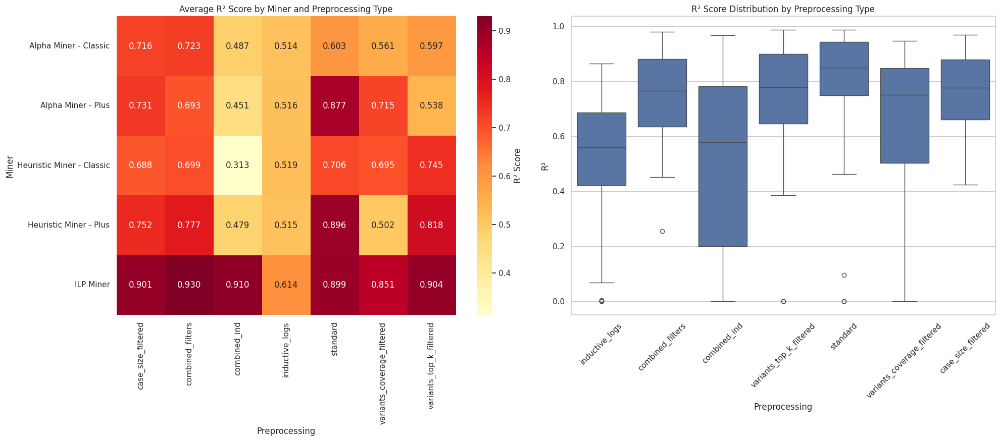


Summary Statistics by Preprocessing Type:
                                R²                            RMSE          \
                              mean     std     min     max    mean     std   
Preprocessing                                                                
case_size_filtered          0.7437  0.1547  0.4244  0.9686  1.8876  3.8683   
combined_filters            0.7484  0.1670  0.2546  0.9792  1.6471  3.6202   
combined_ind                0.4906  0.3358  0.0000  0.9672  4.5024  9.4322   
inductive_logs              0.5280  0.2431  0.0000  0.8636  2.1353  4.2992   
standard                    0.7862  0.2442  0.0000  0.9864  1.0442  2.5630   
variants_coverage_filtered  0.6463  0.2793  0.0000  0.9461  2.0615  4.4083   
variants_top_k_filtered     0.7023  0.2781  0.0000  0.9857  1.6352  4.7295   

                                             
                               min      max  
Preprocessing                                
case_size_filtered          0.0173  12

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def create_performance_visualizations(all_results):
    performance_data = []
    
    for prep_type, prep_results in all_results.items():
        results = prep_results[0]['results']['successful_results']
        
        for miner, metrics in results.items():
            for metric_name, metric_data in metrics.items():
                performance_data.append({
                    'Preprocessing': prep_type,
                    'Miner': miner,
                    'Metric': metric_name,
                    'R²': metric_data['model_performance']['r2'],
                    'RMSE': metric_data['model_performance']['rmse'],
                    'Model': metric_data['model_info']['best_estimator']
                })
    
    df = pd.DataFrame(performance_data)
    
    fig = plt.figure(figsize=(20, 15))
    
    plt.subplot(2, 2, 1)
    pivot_r2 = df.pivot_table(values='R²', 
                             index='Miner', 
                             columns='Preprocessing', 
                             aggfunc='mean')
    sns.heatmap(pivot_r2, annot=True, cmap='YlOrRd', fmt='.3f', 
                cbar_kws={'label': 'R² Score'})
    plt.title('Average R² Score by Miner and Preprocessing Type')
    
    plt.subplot(2, 2, 2)
    sns.boxplot(x='Preprocessing', y='R²', data=df)
    plt.xticks(rotation=45)
    plt.title('R² Score Distribution by Preprocessing Type')
    
    
    
    plt.tight_layout()
    plt.show()
    
    print("\nSummary Statistics by Preprocessing Type:")
    print("=" * 80)
    summary_stats = df.groupby('Preprocessing').agg({
        'R²': ['mean', 'std', 'min', 'max'],
        'RMSE': ['mean', 'std', 'min', 'max']
    }).round(4)
    print(summary_stats)
    
    print("\nMiner Performance Summary:")
    print("=" * 80)
    miner_stats = df.groupby('Miner').agg({
        'R²': ['mean', 'std', 'count'],
        'RMSE': ['mean', 'std']
    }).round(4)
    print(miner_stats)
    
    print("\nTop 5 Best Performing Combinations:")
    print("=" * 80)
    top_5 = df.nlargest(5, 'R²')[['Preprocessing', 'Miner', 'Metric', 'R²', 'RMSE', 'Model']]
    print(top_5)
    
    return df

try:
    performance_df = create_performance_visualizations(all_results)
except Exception as e:
    print(f"An error occurred: {str(e)}")

### feature importance nach preprocessing und miner


In [55]:
feature_map = {
    'feature_0': 'Number of Events',
    'feature_1': 'ATS',
    'feature_2': 'Number of Traces',
    'feature_3': 'Distinct Events',
    'feature_4': 'Distinct Traces',
    'feature_5': 'Distinct Start Events',
    'feature_6': 'Distinct End Events',
    'feature_7': 'Average Trace Length',
    'feature_8': 'Max Trace Length',
    'feature_9': 'Min Trace Length',
    'feature_10': 'Event Density',
    'feature_11': 'Absolute Trace Coverage',
    'feature_12': 'Relative Trace Coverage',
    'feature_13': 'Structure',
    'feature_14': 'Level of Detail',
    'feature_15': 'Traces with Self-loops',
    'feature_16': 'Total Self-loops',
    'feature_17': 'Average Self-loop Size',
    'feature_18': 'Event Diversity',
    'feature_19': 'Event Repeatability',
    'feature_20': 'Transition Consistency',
    'feature_21': 'Sequential Complexity',
    'feature_22': 'Rare Sequence Impact',
    'feature_23': 'Event Class Dispersion',
    'feature_24': 'Event Co-occurrence Consistency',
    'feature_25': 'Trace Variability'
}

In [56]:
import numpy as np
import pandas as pd

prep_miner_importance = {}  # Store by preprocessing and miner
prep_total_importance = {}  # Store total by preprocessing type

for prep_type, prep_results in all_results.items():
    results = prep_results[0]['results']['successful_results']
    
    if prep_type not in prep_miner_importance:
        prep_miner_importance[prep_type] = {}
    if prep_type not in prep_total_importance:
        prep_total_importance[prep_type] = {}
    
    combined_importance = {}  # For overall preprocessing type importance
    
    for miner, metrics in results.items():
        prep_miner_importance[prep_type][miner] = {}
        miner_combined_importance = {}
        
        for metric_name, metric_data in metrics.items():
            feature_importance = metric_data.get('feature_importance')
            
            if feature_importance:
                for feature, importance in feature_importance.items():
                    if feature not in miner_combined_importance:
                        miner_combined_importance[feature] = []
                    miner_combined_importance[feature].append(importance)
                    
                    if feature not in combined_importance:
                        combined_importance[feature] = []
                    combined_importance[feature].append(importance)
        
        if miner_combined_importance:
            prep_miner_importance[prep_type][miner] = {
                feature: np.mean(values)
                for feature, values in miner_combined_importance.items()
            }
    
    if combined_importance:
        prep_total_importance[prep_type] = {
            feature: np.mean(values)
            for feature, values in combined_importance.items()
        }

print("Feature Importance Analysis by Preprocessing Type")
print("=" * 80)

for prep_type in prep_total_importance.keys():
    print(f"\nPreprocessing Type: {prep_type}")
    print("=" * 60)
    
    print("\nOverall Feature Importance for this Preprocessing Type:")
    sorted_total = sorted(prep_total_importance[prep_type].items(), key=lambda x: x[1], reverse=True)
    for feature, imp in sorted_total[:10]:  # Top 10 features
        feature_name = feature_map.get(feature, feature)
        print(f"  {feature_name}: {imp:.6f}")
    
    print("\nPer-Miner Feature Importance:")
    for miner, importance in prep_miner_importance[prep_type].items():
        if importance:  # Only if we have data
            print(f"\n  Miner: {miner}")
            sorted_imp = sorted(importance.items(), key=lambda x: x[1], reverse=True)
            for feature, imp in sorted_imp[:5]:  # Top 10 features
                feature_name = feature_map.get(feature, feature)
                print(f"    {feature_name}: {imp:.6f}")
    
    print("\n" + "=" * 80)

total_rows = []
for prep_type, miners in prep_miner_importance.items():
    for miner, importance in miners.items():
        mapped_importance = {
            feature_map.get(feature, feature): value 
            for feature, value in importance.items()
        }
        row = {
            'Preprocessing': prep_type,
            'Miner': miner,
            **mapped_importance
        }
        total_rows.append(row)

df_total = pd.DataFrame(total_rows)
df_total = df_total.sort_values(['Preprocessing', 'Miner'])
print("Saved feature importance to feature_importance_by_preprocessing_and_miner.csv")

Feature Importance Analysis by Preprocessing Type

Preprocessing Type: inductive_logs

Overall Feature Importance for this Preprocessing Type:
  Min Trace Length: 0.127918
  Number of Traces: 0.126409
  Distinct Events: 0.089512
  Distinct Start Events: 0.062306
  Distinct Traces: 0.054650
  Max Trace Length: 0.054207
  Event Co-occurrence Consistency: 0.053460
  Average Self-loop Size: 0.045115
  Traces with Self-loops: 0.044536
  Trace Variability: 0.041481

Per-Miner Feature Importance:

  Miner: ILP Miner
    Number of Traces: 0.278565
    Min Trace Length: 0.179989
    Distinct Events: 0.177891
    Max Trace Length: 0.075450
    Event Co-occurrence Consistency: 0.044888

  Miner: Heuristic Miner - Classic
    Traces with Self-loops: 0.288054
    Number of Traces: 0.111394
    Distinct Traces: 0.083447
    Event Repeatability: 0.073795
    Min Trace Length: 0.071512

  Miner: Heuristic Miner - Plus
    Min Trace Length: 0.139410
    Number of Traces: 0.126036
    Distinct Events: 0

#### feature importance nach preprocessing ranked

In [57]:
import numpy as np
import pandas as pd

miner_metric_importance = {}  # Store by miner and metric
miner_total_importance = {}   # Store total by miner

for prep_type, prep_results in all_results.items():
    results = prep_results[0]['results']['successful_results']
    
    for miner, metrics in results.items():
        if miner not in miner_metric_importance:
            miner_metric_importance[miner] = {}
        if miner not in miner_total_importance:
            miner_total_importance[miner] = {}
        
        for metric_name, metric_data in metrics.items():
            if metric_name not in miner_metric_importance[miner]:
                miner_metric_importance[miner][metric_name] = {}
            
            feature_importance = metric_data.get('feature_importance')
            
            if feature_importance:
                for feature, importance in feature_importance.items():
                    if feature not in miner_metric_importance[miner][metric_name]:
                        miner_metric_importance[miner][metric_name][feature] = []
                    miner_metric_importance[miner][metric_name][feature].append(importance)
                    
                    if feature not in miner_total_importance[miner]:
                        miner_total_importance[miner][feature] = []
                    miner_total_importance[miner][feature].append(importance)

miner_metric_avg = {}
miner_total_avg = {}

for miner, metrics in miner_metric_importance.items():
    miner_metric_avg[miner] = {}
    for metric, features in metrics.items():
        miner_metric_avg[miner][metric] = {
            feature: np.mean(values)
            for feature, values in features.items()
        }

for miner, features in miner_total_importance.items():
    miner_total_avg[miner] = {
        feature: np.mean(values)
        for feature, values in features.items()
    }

print("Feature Importance Analysis by Miner and Metric")
print("=" * 80)

for miner in miner_metric_avg.keys():
    print(f"\nMiner: {miner}")
    print("=" * 40)
    
    print("\nPer-Metric Feature Importance:")
    for metric, importance in miner_metric_avg[miner].items():
        print(f"\nMetric: {metric}")
        sorted_imp = sorted(importance.items(), key=lambda x: x[1], reverse=True)
        print("Top 10 features:")
        for feature, imp in sorted_imp[:10]:
            print(f"  {feature}: {imp:.6f}")
    
    print("\nTotal Average Feature Importance:")
    sorted_total = sorted(miner_total_avg[miner].items(), key=lambda x: x[1], reverse=True)
    print("Top 10 features:")
    for feature, imp in sorted_total[:10]:
        print(f"  {feature}: {imp:.6f}")
    
    print("\n" + "=" * 80)

for miner, metric_data in miner_metric_avg.items():
    rows = []
    for metric, importance in metric_data.items():
        row = {
            'Metric': metric,
            **importance
        }
        rows.append(row)
    
    if rows:
        df = pd.DataFrame(rows)
        filename = f'feature_importance_{miner.replace(" ", "_")}_by_metric.csv'
        df.to_csv(filename, index=False)
        print(f"Saved metric breakdown for {miner} to {filename}")

total_rows = []
for miner, importance in miner_total_avg.items():
    row = {
        'Miner': miner,
        **importance
    }
    total_rows.append(row)

df_total = pd.DataFrame(total_rows)
print("Saved total feature importance to feature_importance_total_by_miner.csv")

print("\nOverall Statistics:")
print("=" * 40)
for miner, metrics in miner_metric_avg.items():
    print(f"\n{miner}:")
    metric_count = len(metrics)
    feature_counts = [len(importance) for importance in metrics.values()]
    avg_features = np.mean(feature_counts)
    
    print(f"Number of metrics: {metric_count}")
    print(f"Average features per metric: {avg_features:.1f}")
    print(f"Total unique features: {len(miner_total_avg[miner])}")

Feature Importance Analysis by Miner and Metric

Miner: ILP Miner

Per-Metric Feature Importance:

Metric: fscore
Top 10 features:
  feature_21: 0.202685
  feature_8: 0.113271
  feature_15: 0.099954
  feature_3: 0.091953
  feature_2: 0.089454
  feature_18: 0.062036
  feature_24: 0.058759
  feature_16: 0.042351
  feature_19: 0.032881
  feature_5: 0.027901

Metric: generalization
Top 10 features:
  feature_13: 0.317536
  feature_1: 0.091363
  feature_8: 0.088222
  feature_9: 0.086315
  feature_3: 0.073837
  feature_0: 0.052802
  feature_2: 0.038445
  feature_15: 0.028412
  feature_6: 0.028248
  feature_25: 0.028180

Metric: metricsAverageWeight
Top 10 features:
  feature_24: 0.266481
  feature_2: 0.227665
  feature_3: 0.125899
  feature_8: 0.107768
  feature_13: 0.072368
  feature_9: 0.038845
  feature_7: 0.029198
  feature_14: 0.021284
  feature_1: 0.013037
  feature_21: 0.012984

Metric: precision
Top 10 features:
  feature_8: 0.151635
  feature_3: 0.138049
  feature_20: 0.128467
  fea

#### old feature importance

In [58]:
import numpy as np
import pandas as pd

feature_importance_summary = {}

for prep_type, prep_results in all_results.items():
    feature_importance_summary[prep_type] = {}
    combined_importance = {}
    
    results = prep_results[0]['results']['successful_results']
    
    for miner, metrics in results.items():
        feature_importance_summary[prep_type][miner] = {}
        
        for metric_name, metric_data in metrics.items():
            feature_importance = metric_data.get('feature_importance')
            
            if feature_importance:  # If feature importance exists
                feature_importance_summary[prep_type][miner][metric_name] = feature_importance
                
                for feature, importance in feature_importance.items():
                    if feature not in combined_importance:
                        combined_importance[feature] = []
                    combined_importance[feature].append(importance)
    
    avg_importance = {
        feature: np.mean(values) 
        for feature, values in combined_importance.items()
    }
    
    sorted_features = sorted(avg_importance.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\nPreprocessing Type: {prep_type}")
    print("=" * 80)
    print("\nOverall Feature Importance:")
    for feature, importance in sorted_features:
        print(f"{feature}: {importance:.6f}")
    
    print("\nPer-Miner Feature Importance:")
    for miner, metrics in feature_importance_summary[prep_type].items():
        print(f"\n{miner}:")
        for metric_name, importance in metrics.items():
            print(f"\n  {metric_name}:")
            sorted_imp = sorted(importance.items(), key=lambda x: x[1], reverse=True)
            for feature, imp in sorted_imp[:10]:  # Show top 10 features
                print(f"    {feature}: {imp:.6f}")
    
    print("\n" + "=" * 80)

for prep_type, importance_data in feature_importance_summary.items():
    rows = []
    for miner, metrics in importance_data.items():
        for metric_name, importance in metrics.items():
            row = {
                'Miner': miner,
                'Metric': metric_name,
                **importance
            }
            rows.append(row)
    
    if rows:  # If we have data to save
        df = pd.DataFrame(rows)
        filename = f'feature_importance_{prep_type}.csv'
        df.to_csv(filename, index=False)
        print(f"Saved feature importance for {prep_type} to {filename}")


Preprocessing Type: inductive_logs

Overall Feature Importance:
feature_9: 0.127918
feature_2: 0.126409
feature_3: 0.089512
feature_5: 0.062306
feature_4: 0.054650
feature_8: 0.054207
feature_24: 0.053460
feature_17: 0.045115
feature_15: 0.044536
feature_25: 0.041481
feature_0: 0.040826
feature_6: 0.036659
feature_13: 0.032359
feature_21: 0.029448
feature_18: 0.027780
feature_14: 0.025564
feature_19: 0.024953
feature_7: 0.021875
feature_20: 0.019352
feature_23: 0.014114
feature_16: 0.013925
feature_10: 0.008033
feature_12: 0.005519
feature_1: 0.000000
feature_11: 0.000000
feature_22: 0.000000

Per-Miner Feature Importance:

ILP Miner:

  generalization:
    feature_9: 0.289641
    feature_3: 0.131300
    feature_6: 0.110549
    feature_2: 0.070123
    feature_25: 0.068271
    feature_0: 0.050589
    feature_18: 0.040233
    feature_17: 0.034431
    feature_15: 0.027175
    feature_5: 0.021534

  metricsAverageWeight:
    feature_2: 0.550038
    feature_3: 0.196088
    feature_9: 0.082

## splittedby miner

In [59]:
import json

def extract_successful_results(json_file_path):
    """
    Extract successful results from the JSON file.
    
    Args:
        json_file_path (str): Path to the JSON file
        
    Returns:
        dict: Dictionary containing only successful results organized by miner and metric
    """
    successful_results = {}
    
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    
    for miner_name, miner_data in data['miners'].items():
        successful_results[miner_name] = {}
        
        for metric_name, metric_data in miner_data.items():
            if metric_data.get('status') == 'success':
                successful_results[miner_name][metric_name] = {
                    'model_performance': metric_data['model_performance'],
                    'model_info': metric_data['model_info'],
                    'feature_importance': metric_data.get('feature_importance')  # Some might not have this
                }
    
    return {
        'df_type': data['df_type'],
        'results': {
            'successful_results': successful_results
        }
    }



### best predictable metrics, feature importance

In [ ]:
def analyze_results(results):
    """
    Analyze results to find best predictable metrics and most important features.
    
    Args:
        results (dict): Dictionary containing the extracted successful results
        
    Returns:
        tuple: (best_metrics_by_miner, best_metrics_overall, miner_metric_importance)
    """
    best_metrics_by_miner = {}
    miner_metric_importance = {}  # Store importance by miner and metric
    all_metrics_performance = []
    
    for miner, metrics in results['results']['successful_results'].items():
        best_metrics_by_miner[miner] = []
        miner_metric_importance[miner] = {}  # Initialize nested dict for this miner
        
        for metric_name, metric_data in metrics.items():
            performance = metric_data['model_performance']
            r2_score = performance['r2']
            rmse = performance['rmse']
            
            metric_info = {
                'miner': miner,
                'metric': metric_name,
                'r2': r2_score,
                'rmse': rmse,
                'model': metric_data['model_info']['best_estimator']
            }
            best_metrics_by_miner[miner].append(metric_info)
            all_metrics_performance.append(metric_info)
            
            if metric_data.get('feature_importance'):
                sorted_features = sorted(
                    metric_data['feature_importance'].items(),
                    key=lambda x: x[1],
                    reverse=True
                )
                miner_metric_importance[miner][metric_name] = sorted_features
    
    for miner in best_metrics_by_miner:
        best_metrics_by_miner[miner] = sorted(
            best_metrics_by_miner[miner],
            key=lambda x: x['r2'],
            reverse=True
        )
    
    best_metrics_overall = sorted(all_metrics_performance, key=lambda x: x['r2'], reverse=True)
    
    return best_metrics_by_miner, best_metrics_overall, miner_metric_importance

def print_analysis(best_metrics_by_miner, best_metrics_overall, miner_metric_importance):
    """Print the analysis results in a formatted way."""
    print("=== Best Predictable Metrics by Miner ===")
    print("=" * 80)
    for miner, metrics in best_metrics_by_miner.items():
        print(f"\nMiner: {miner}")
        print("-" * 60)
        for metric in metrics:
            print(f"Metric: {metric['metric']}")
            print(f"R² Score: {metric['r2']:.4f}")
            print(f"RMSE: {metric['rmse']:.4f}")
            print(f"Best Model: {metric['model']}")
            
            if miner in miner_metric_importance and metric['metric'] in miner_metric_importance[miner]:
                print("Top 5 Most Important Features:")
                for feature, importance in miner_metric_importance[miner][metric['metric']][:5]:
                    print(f"  { feature_map.get(feature, feature)}: {importance:.4f}")
            print("-" * 40)
    
    print("\n=== Top 5 Best Predictable Metrics Overall ===")
    print("=" * 80)
    for metric in best_metrics_overall[:5]:
        print(f"\nMiner: {metric['miner']}")
        print(f"Metric: {metric['metric']}")
        print(f"R² Score: {metric['r2']:.4f}")
        
        if (metric['miner'] in miner_metric_importance and 
            metric['metric'] in miner_metric_importance[metric['miner']]):
            print("Top 5 Most Important Features:")
            for feature, importance in miner_metric_importance[metric['miner']][metric['metric']][:5]:
                print(f"  {feature}: {importance:.4f}")
        print("-" * 60)
    
    print("\n=== Detailed Feature Importance by Miner and Metric ===")
    print("=" * 80)
    for miner, metric_data in miner_metric_importance.items():
        print(f"\nMiner: {miner}")
        print("=" * 60)
        
        for metric_name, features in metric_data.items():
            print(f"\nMetric: {metric_name}")
            print("-" * 40)
            r2_score = next(m['r2'] for m in best_metrics_by_miner[miner] 
                        if m['metric'] == metric_name)
            print(f"R² Score: {r2_score:.4f}")
            print("Top 5 Most Important Features:")
            for feature, importance in features[:5]:
                feature_name = feature_map.get(feature, feature)
                print(f"  {feature_name}: {importance:.4f}")

results = extract_successful_results('/home/jupyter-benjamin.andrick-3cf07/test/Outputs/RegressionResults_Miner/regression_results_all_all_logtypes.json')

best_by_miner, best_overall, miner_metric_importance = analyze_results(results)
print_analysis(best_by_miner, best_overall, miner_metric_importance)



=== Best Predictable Metrics by Miner ===

Miner: ILP Miner
------------------------------------------------------------
Metric: fscore
R² Score: 0.9764
RMSE: 0.0272
Best Model: xgboost
Top 5 Most Important Features:
  Sequential Complexity: 0.4294
  Number of Traces: 0.1903
  Traces with Self-loops: 0.0816
  Average Trace Length: 0.0507
  ATS: 0.0308
----------------------------------------
Metric: simplicity
R² Score: 0.9733
RMSE: 0.0178
Best Model: histgb
----------------------------------------
Metric: metricsAverageWeight
R² Score: 0.9704
RMSE: 0.0112
Best Model: extra_tree
Top 5 Most Important Features:
  Number of Traces: 0.2206
  Max Trace Length: 0.2021
  Structure: 0.0793
  Min Trace Length: 0.0752
  ATS: 0.0495
----------------------------------------
Metric: precision
R² Score: 0.9599
RMSE: 0.0302
Best Model: histgb
----------------------------------------
Metric: generalization
R² Score: 0.9239
RMSE: 0.0252
Best Model: xgboost
Top 5 Most Important Features:
  ATS: 0.7799
 

## regression ana best miner prediction

### abhängig von preprocessing

#### evaluation across all preprp Types

In [ ]:
import json

def extract_prediction_results(json_file_path):
    """
    Extract prediction results from the JSON file.
    
    Args:
        json_file_path (str): Path to the JSON file
        
    Returns:
        dict: Dictionary containing organized prediction results
    """
    results = {
        'preprocessing_methods': {}
    }
    
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    
    for preproc_method, metrics in data.items():
        results['preprocessing_methods'][preproc_method] = {}
        
        for metric_name, metric_data in metrics.items():
            if 'results' not in metric_data:
                continue
                
            metric_results = metric_data['results']
            if metric_results.get('status') != 'success':
                continue
                
            results['preprocessing_methods'][preproc_method][metric_name] = {
                'model_performance': metric_results['model_performance'],
                'best_model': metric_results['model_info']['best_estimator'],
                'feature_importance': metric_results.get('feature_importance', {}),
                'miner_mapping': metric_data['miner_mapping'],
                'class_distribution': metric_data['class_distribution'],
                'data_info': metric_results['data_info']
            }
    
    return results

def print_summary(results):
    """Print a summary of the prediction results."""
    print("=== Prediction Results Summary ===")
    print("=" * 80)
    
    for preproc_method, metrics in results['preprocessing_methods'].items():
        print(f"\nPreprocessing Method: {preproc_method}")
        print("-" * 60)
        
        for metric_name, metric_data in metrics.items():
            print(f"\nMetric: {metric_name}")
            print(f"R² Score: {metric_data['model_performance']['r2']:.4f}")
            print(f"RMSE: {metric_data['model_performance']['rmse']:.4f}")
            print(f"Best Model: {metric_data['best_model']}")
            
            if metric_data['feature_importance']:
                print("Top 5 Most Important Features:")
                sorted_features = sorted(
                    metric_data['feature_importance'].items(),
                    key=lambda x: x[1],
                    reverse=True
                )
                for feature, importance in sorted_features[:5]:
                    print(f"  {feature}: {importance:.4f}")
            
            print("\nClass Distribution:")
            for miner, count in metric_data['class_distribution'].items():
                print(f"  {miner}: {count}")
            print("-" * 40)

json_file_path = '/home/jupyter-benjamin.andrick-3cf07/test/Outputs/Regression_pred_best_miner/miner_prediction_results_all_preprocessing.json'
results = extract_prediction_results(json_file_path)
print_summary(results)

=== Prediction Results Summary ===

Preprocessing Method: combined_ind
------------------------------------------------------------

Metric: perc_fit_traces
R² Score: -0.2740
RMSE: 0.5919
Best Model: xgboost
Top 5 Most Important Features:
  feature_25: 0.1021
  feature_5: 0.0841
  feature_7: 0.0752
  feature_17: 0.0624
  feature_9: 0.0575

Class Distribution:
  Alpha Miner - Classic: 15
  Alpha Miner - Plus: 44
  Heuristic Miner - Classic: 363
  Heuristic Miner - Plus: 19
----------------------------------------

Metric: average_trace_fitness
R² Score: -1.3805
RMSE: 0.4261
Best Model: xgboost
Top 5 Most Important Features:
  feature_13: 0.4835
  feature_17: 0.0950
  feature_10: 0.0638
  feature_2: 0.0533
  feature_4: 0.0521

Class Distribution:
  Alpha Miner - Classic: 3
  Alpha Miner - Plus: 6
  Heuristic Miner - Classic: 427
  Heuristic Miner - Plus: 5
----------------------------------------

Metric: log_fitness
R² Score: -0.1269
RMSE: 0.2657
Best Model: xgboost
Top 5 Most Important

#### evaluation across all preprp Types + Summary

In [65]:
import json
from collections import defaultdict

def extract_prediction_results(json_file_path):
    """
    Extract prediction results from the JSON file.
    
    Args:
        json_file_path (str): Path to the JSON file
        
    Returns:
        tuple: (results_by_preproc, overall_summary)
    """
    results_by_preproc = {
        'preprocessing_methods': {}
    }
    
    overall_summary = defaultdict(list)
    
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    
    for preproc_method, metrics in data.items():
        results_by_preproc['preprocessing_methods'][preproc_method] = {}
        
        for metric_name, metric_data in metrics.items():
            if 'results' not in metric_data:
                continue
                
            metric_results = metric_data['results']
            if metric_results.get('status') != 'success':
                continue
                
            metric_info = {
                'model_performance': metric_results['model_performance'],
                'best_model': metric_results['model_info']['best_estimator'],
                'feature_importance': metric_results.get('feature_importance', {}),
                'miner_mapping': metric_data['miner_mapping'],
                'class_distribution': metric_data['class_distribution'],
                'data_info': metric_results['data_info'],
                'preprocessing': preproc_method
            }
            
            results_by_preproc['preprocessing_methods'][preproc_method][metric_name] = metric_info
            
            overall_summary[metric_name].append(metric_info)
    
    return results_by_preproc, overall_summary

def calculate_feature_importance_summary(feature_importance_list):
    """Calculate average feature importance across multiple results."""
    feature_scores = defaultdict(list)
    
    for importance_dict in feature_importance_list:
        for feature, score in importance_dict.items():
            feature_scores[feature].append(score)
    
    avg_importance = {
        feature: sum(scores) / len(scores)
        for feature, scores in feature_scores.items()
    }
    
    return dict(sorted(avg_importance.items(), key=lambda x: x[1], reverse=True))

def print_summary(results_by_preproc, overall_summary):
    """Print a comprehensive summary of the prediction results."""
    print("=== Results by Preprocessing Method ===")
    print("=" * 80)
    
    for preproc_method, metrics in results_by_preproc['preprocessing_methods'].items():
        print(f"\nPreprocessing Method: {preproc_method}")
        print("-" * 60)
        
        for metric_name, metric_data in metrics.items():
            print(f"\nMetric: {metric_name}")
            print(f"R² Score: {metric_data['model_performance']['r2']:.4f}")
            print(f"RMSE: {metric_data['model_performance']['rmse']:.4f}")
            print(f"Best Model: {metric_data['best_model']}")
            
            if metric_data['feature_importance']:
                sorted_features = sorted(
                    metric_data['feature_importance'].items(),
                    key=lambda x: x[1],
                    reverse=True
                )
            
            print("-" * 40)
    
    print("\n\n=== Overall Summary Across All Preprocessing Methods ===")
    print("=" * 80)
    
    for metric_name, metric_results in overall_summary.items():
        print(f"\nMetric: {metric_name}")
        print("-" * 60)
        
        avg_r2 = sum(r['model_performance']['r2'] for r in metric_results) / len(metric_results)
        avg_rmse = sum(r['model_performance']['rmse'] for r in metric_results) / len(metric_results)
        
        print(f"Average R² Score: {avg_r2:.4f}")
        print(f"Average RMSE: {avg_rmse:.4f}")
        
        best_result = max(metric_results, key=lambda x: x['model_performance']['r2'])
        print(f"Best Preprocessing Method: {best_result['preprocessing']}")
        print(f"Best R² Score: {best_result['model_performance']['r2']:.4f}")
        print(f"Best RMSE: {best_result['model_performance']['rmse']:.4f}")
        
        feature_importance_list = [r['feature_importance'] for r in metric_results if r['feature_importance']]
        if feature_importance_list:
            avg_importance = calculate_feature_importance_summary(feature_importance_list)
            print("\nTop 5 Most Important Features (Average):")
            for feature, importance in list(avg_importance.items())[:3]:
                print(f"  {feature}: {importance:.4f}")
        
        total_distribution = defaultdict(int)
        for result in metric_results:
            for miner, count in result['class_distribution'].items():
                total_distribution[miner] += count
        
        print("\nTotal Class Distribution:")
        for miner, count in total_distribution.items():
            print(f"  {miner}: {count}")
        print("-" * 40)

results_by_preproc, overall_summary = extract_prediction_results(json_file_path)
print_summary(results_by_preproc, overall_summary)

=== Results by Preprocessing Method ===

Preprocessing Method: combined_ind
------------------------------------------------------------

Metric: perc_fit_traces
R² Score: -0.2740
RMSE: 0.5919
Best Model: xgboost
----------------------------------------

Metric: average_trace_fitness
R² Score: -1.3805
RMSE: 0.4261
Best Model: xgboost
----------------------------------------

Metric: log_fitness
R² Score: -0.1269
RMSE: 0.2657
Best Model: xgboost
----------------------------------------

Metric: percentage_of_fitting_traces
R² Score: -0.5850
RMSE: 0.6602
Best Model: xgboost
----------------------------------------

Metric: precision
R² Score: 0.2586
RMSE: 0.5604
Best Model: xgboost
----------------------------------------

Metric: generalization
R² Score: 0.3068
RMSE: 0.5721
Best Model: rf
----------------------------------------

Metric: simplicity
R² Score: 0.1459
RMSE: 0.8643
Best Model: xgboost
----------------------------------------

Metric: metricsAverageWeight
R² Score: -0.0688
R

In [66]:
import json
from collections import defaultdict

def extract_prediction_results(json_file_path):
    """
    Extract prediction results from the JSON file.
    
    Args:
        json_file_path (str): Path to the JSON file
        
    Returns:
        tuple: (results_by_preproc, overall_summary)
    """
    results_by_preproc = {
        'preprocessing_methods': {}
    }
    
    overall_summary = defaultdict(list)
    
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    
    for preproc_method, metrics in data.items():
        results_by_preproc['preprocessing_methods'][preproc_method] = {}
        
        for metric_name, metric_data in metrics.items():
            if 'results' not in metric_data:
                continue
                
            metric_results = metric_data['results']
            if metric_results.get('status') != 'success':
                continue
                
            metric_info = {
                'model_performance': metric_results['model_performance'],
                'best_model': metric_results['model_info']['best_estimator'],
                'feature_importance': metric_results.get('feature_importance', {}),
                'miner_mapping': metric_data['miner_mapping'],
                'class_distribution': metric_data['class_distribution'],
                'data_info': metric_results['data_info'],
                'preprocessing': preproc_method
            }
            
            results_by_preproc['preprocessing_methods'][preproc_method][metric_name] = metric_info
            
            overall_summary[metric_name].append(metric_info)
    
    return results_by_preproc, overall_summary

def calculate_feature_importance_summary(feature_importance_list):
    """Calculate average feature importance across multiple results."""
    feature_scores = defaultdict(list)
    
    for importance_dict in feature_importance_list:
        for feature, score in importance_dict.items():
            feature_scores[feature].append(score)
    
    avg_importance = {
        feature: sum(scores) / len(scores)
        for feature, scores in feature_scores.items()
    }
    
    return dict(sorted(avg_importance.items(), key=lambda x: x[1], reverse=True))

def print_summary(results_by_preproc, overall_summary):
    """Print a comprehensive summary of the prediction results."""
    print("=== Results by Preprocessing Method ===")
    print("=" * 80)
    
    for preproc_method, metrics in results_by_preproc['preprocessing_methods'].items():
        print(f"\nPreprocessing Method: {preproc_method}")
        print("-" * 60)
        
        for metric_name, metric_data in metrics.items():
            print(f"\nMetric: {metric_name}")
            print(f"R² Score: {metric_data['model_performance']['r2']:.4f}")
            print(f"RMSE: {metric_data['model_performance']['rmse']:.4f}")
            print(f"Best Model: {metric_data['best_model']}")
            
            if metric_data['feature_importance']:
                print("Top 3 Most Important Features:")
                sorted_features = sorted(
                    metric_data['feature_importance'].items(),
                    key=lambda x: x[1],
                    reverse=True
                )
            
            print("\nClass Distribution:")
            for miner, count in metric_data['class_distribution'].items():
                print(f"  {miner}: {count}")
            print("-" * 40)
    
    print("\n\n=== Overall Summary Across All Preprocessing Methods ===")
    print("=" * 80)
    
    for metric_name, metric_results in overall_summary.items():
        print(f"\nMetric: {metric_name}")
        print("-" * 60)
        
        avg_r2 = sum(r['model_performance']['r2'] for r in metric_results) / len(metric_results)
        avg_rmse = sum(r['model_performance']['rmse'] for r in metric_results) / len(metric_results)
        
        print(f"Average R² Score: {avg_r2:.4f}")
        print(f"Average RMSE: {avg_rmse:.4f}")
        
        best_result = max(metric_results, key=lambda x: x['model_performance']['r2'])
        print(f"Best Preprocessing Method: {best_result['preprocessing']}")
        print(f"Best R² Score: {best_result['model_performance']['r2']:.4f}")
        print(f"Best RMSE: {best_result['model_performance']['rmse']:.4f}")
        
        feature_importance_list = [r['feature_importance'] for r in metric_results if r['feature_importance']]
        if feature_importance_list:
            avg_importance = calculate_feature_importance_summary(feature_importance_list)
            print("\nTop 5 Most Important Features (Average):")
            for feature, importance in list(avg_importance.items())[:3]:
                print(f"  {feature}: {importance:.4f}")
        
        total_distribution = defaultdict(int)
        for result in metric_results:
            for miner, count in result['class_distribution'].items():
                total_distribution[miner] += count
        
        print("\nTotal Class Distribution:")
        for miner, count in total_distribution.items():
            print(f"  {miner}: {count}")
        print("-" * 40)

results_by_preproc, overall_summary = extract_prediction_results(json_file_path)
print_summary(results_by_preproc, overall_summary)

=== Results by Preprocessing Method ===

Preprocessing Method: combined_ind
------------------------------------------------------------

Metric: perc_fit_traces
R² Score: -0.2740
RMSE: 0.5919
Best Model: xgboost
Top 3 Most Important Features:

Class Distribution:
  Alpha Miner - Classic: 15
  Alpha Miner - Plus: 44
  Heuristic Miner - Classic: 363
  Heuristic Miner - Plus: 19
----------------------------------------

Metric: average_trace_fitness
R² Score: -1.3805
RMSE: 0.4261
Best Model: xgboost
Top 3 Most Important Features:

Class Distribution:
  Alpha Miner - Classic: 3
  Alpha Miner - Plus: 6
  Heuristic Miner - Classic: 427
  Heuristic Miner - Plus: 5
----------------------------------------

Metric: log_fitness
R² Score: -0.1269
RMSE: 0.2657
Best Model: xgboost
Top 3 Most Important Features:

Class Distribution:
  Alpha Miner - Classic: 2
  Alpha Miner - Plus: 7
  Heuristic Miner - Classic: 429
  Heuristic Miner - Plus: 3
----------------------------------------

Metric: percen

### unabhängig von preprocessing

In [67]:
import json

with open('Outputs/Regression_pred_best_miner_combined/miner_prediction_results.json', 'r') as f:
    data = json.load(f)

def summarize_results(data):
    summary = {}
    for metric, details in data.items():
        results = details['results']
        model_performance = results['model_performance']
        feature_importance = results.get('feature_importance')
        
        r2 = model_performance['r2']
        rmse = model_performance['rmse']
        
        top_features = []
        if feature_importance:
            sorted_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)
            top_features = sorted_features[:5]
        
        class_distribution = details['class_distribution']
        
        summary[metric] = {
            'R² Score': r2,
            'RMSE': rmse,
            'Top 5 Features': top_features,
            'Model': results['model_info']['best_estimator'],
            'Class Distribution': class_distribution
        }
    
    return summary

summary = summarize_results(data)

for metric, details in summary.items():
    print(f"\nMetric: {metric}")
    print(f"Model: {details['Model']}")
    print(f"R² Score: {details['R² Score']:.4f}")
    print(f"RMSE: {details['RMSE']:.4f}")
    
    print("\nClass Distribution:")
    for miner, count in details['Class Distribution'].items():
        print(f"  {miner}: {count}")
    
    print("-" * 80)


Metric: perc_fit_traces
Model: xgboost
R² Score: 0.3102
RMSE: 0.4643

Class Distribution:
  Alpha Miner - Classic: 50
  Alpha Miner - Plus: 353
  Heuristic Miner - Classic: 2392
  Heuristic Miner - Plus: 466
--------------------------------------------------------------------------------

Metric: average_trace_fitness
Model: xgboost
R² Score: 0.3698
RMSE: 0.3067

Class Distribution:
  Alpha Miner - Classic: 19
  Alpha Miner - Plus: 67
  Heuristic Miner - Classic: 2801
  Heuristic Miner - Plus: 374
--------------------------------------------------------------------------------

Metric: log_fitness
Model: xgboost
R² Score: 0.4594
RMSE: 0.2760

Class Distribution:
  Alpha Miner - Classic: 18
  Alpha Miner - Plus: 59
  Heuristic Miner - Classic: 2829
  Heuristic Miner - Plus: 355
--------------------------------------------------------------------------------

Metric: percentage_of_fitting_traces
Model: histgb
R² Score: 0.1965
RMSE: 0.5011

Class Distribution:
  Alpha Miner - Classic: 50